In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib as mpl
import matplotlib.pyplot as plt
from colorspacious import cspace_converter
from matplotlib.pyplot import rc_context
from matplotlib import colormaps
import scipy
import scipy.stats as stats
import matplotlib.ticker as ticker
import json
import anndata as ad
from scipy.sparse import hstack

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.3 anndata==0.9.2 umap==0.5.3 numpy==1.24.3 scipy==1.11.1 pandas==1.5.3 scikit-learn==1.1.3 statsmodels==0.14.0 python-igraph==0.10.6 pynndescent==0.5.10


In [3]:
G2M_genes_list = ["Hmgb2","Cdk1","Nusap1","Ube2c","Birc5","Tpx2","Top2a","Ndc80","Cks2",
                  "Nuf2","Cks1b","Mki67","Cenpf","Tacc3","Pimreg","Smc4","Ccnb2","Ckap2l",
                  "Ckap2","Aurkb","Bub1","Kif11","Anp32e","Tubb4b","Gtse1","Kif20b","Hjurp",
                  "Cdca3","Jpt1","Cdc20","Ttk","Cdc25c","Kif2c","Rangap1","Ncapd2","Dlgap5",
                  "Cdca2","Cdca8","Ect2", "Kif23","Hmmr","Aurka","Psrc1","Anln","Lbr","Ckap5",
                  "Cenpe","Ctcf", "Nek2","G2e3","Gas2l3", "Cbx5","Cenpa"]
S_genes_list = ["Mcm5","Pcna","Tyms","Fen1","Mcm7","Mcm4","Rrm1","Ung","Gins2","Mcm6","Cdca7",
                "Dtl","Prim1","Uhrf1","Cenpu","Hells","Rfc2","Polr1b","Nasp","Rad51ap1","Gmnn",
                "Wdr76","Slbp","Ccne2","Ubr7","Msh2","Rad51","Rrm2","Cdc45","Cdc6","Exo1","Tipin",
                "Dscc1","Blm","Casp8ap2", "Usp1","Clspn","Pola1","Chaf1b","Mrpl36","E2f8"]

In [4]:
adata_merged = sc.read_h5ad('/vol/ExtraVol/MergedData_Glial_Neuronal_Immune_removed.h5ad')

In [5]:
adata_merged.uns['log1p']["base"] = None

In [6]:
# Create a boolean mask for all cells that come from the development dataset
development_samples = adata_merged.obs['stage'].isin(['uninfected_adult_1', 'uninfected_adult_2', 'embryonic', 'shortly_after_birth', 'after_weaning'])

# Subset the AnnData object
adata = adata_merged[development_samples].copy()

print(adata.obs['stage'].cat.categories)


Index(['after_weaning', 'embryonic', 'shortly_after_birth',
       'uninfected_adult_1', 'uninfected_adult_2'],
      dtype='object')


normalizing counts per cell
    finished (0:00:00)


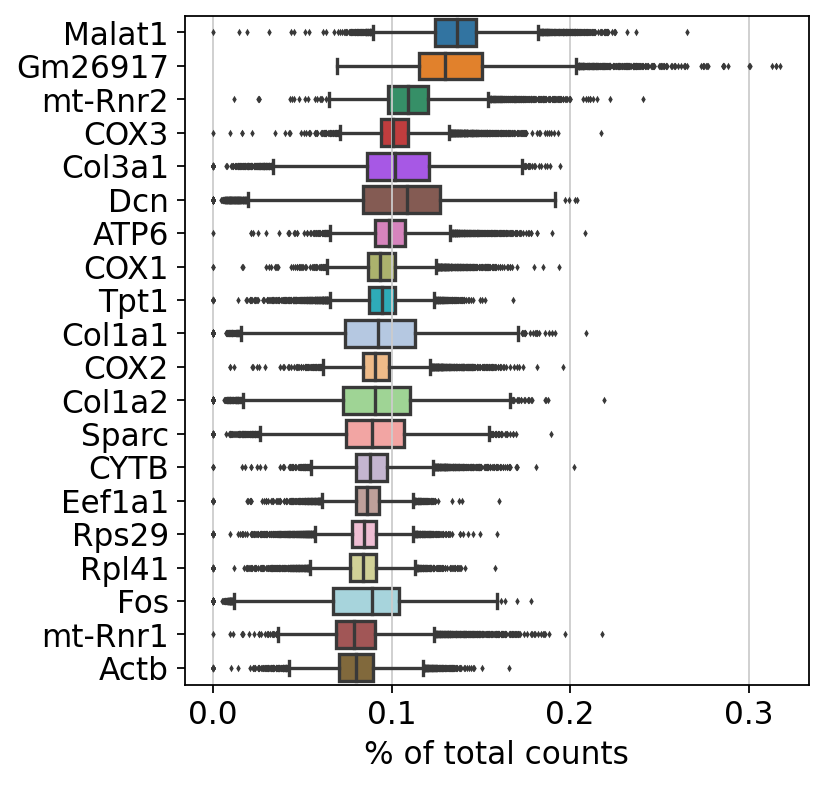

In [7]:
sc.pl.highest_expr_genes(adata, n_top=20, )

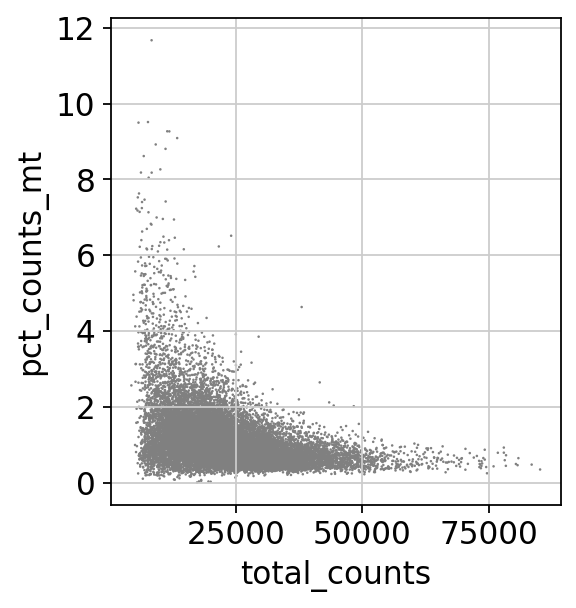

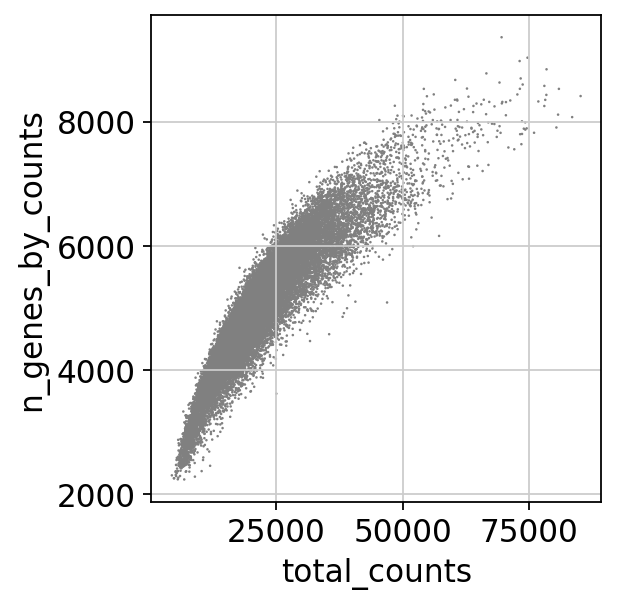

In [8]:
#Visualize QC metrics to assure consistency with the previous work
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [9]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:08)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


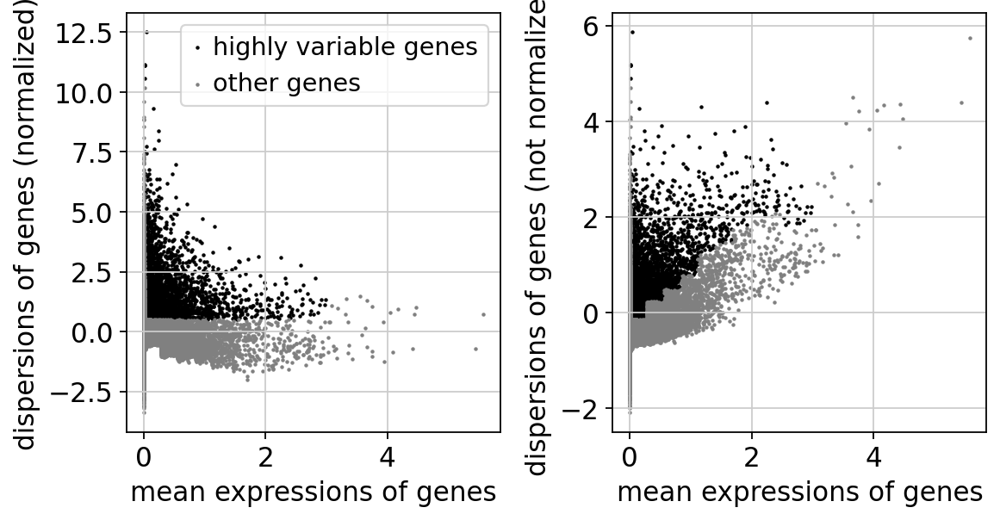

In [10]:
sc.pl.highly_variable_genes(adata)

In [11]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


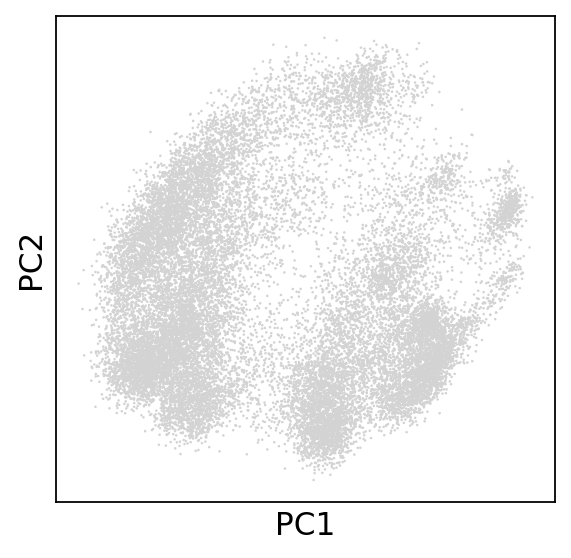

In [12]:
sc.pl.pca(adata)

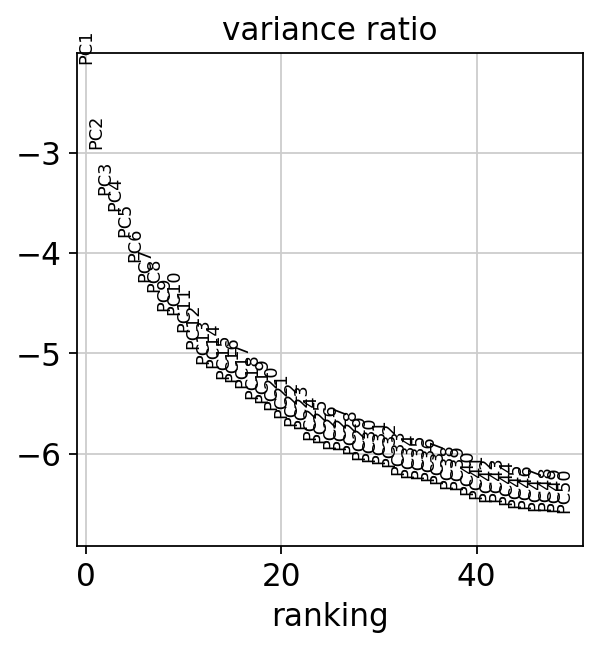

In [13]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

In [14]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:28)


In [15]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


In [16]:
sc.tl.leiden(adata, resolution=1)

running Leiden clustering
    finished: found 31 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:05)


In [17]:
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata, init_pos='paga', min_dist=0.6)

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:01)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


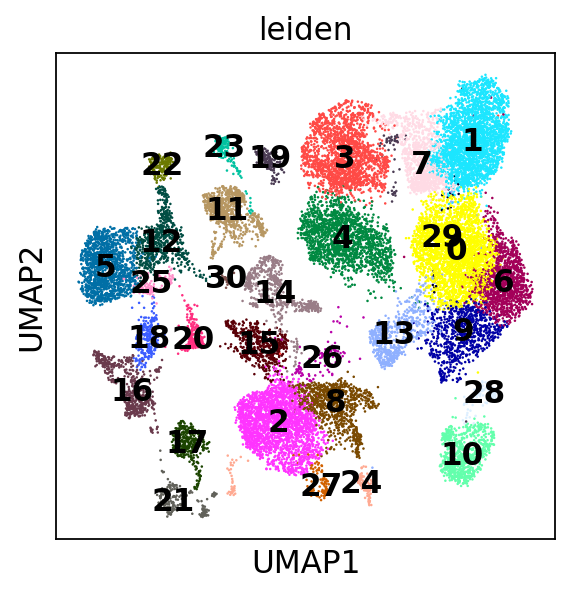

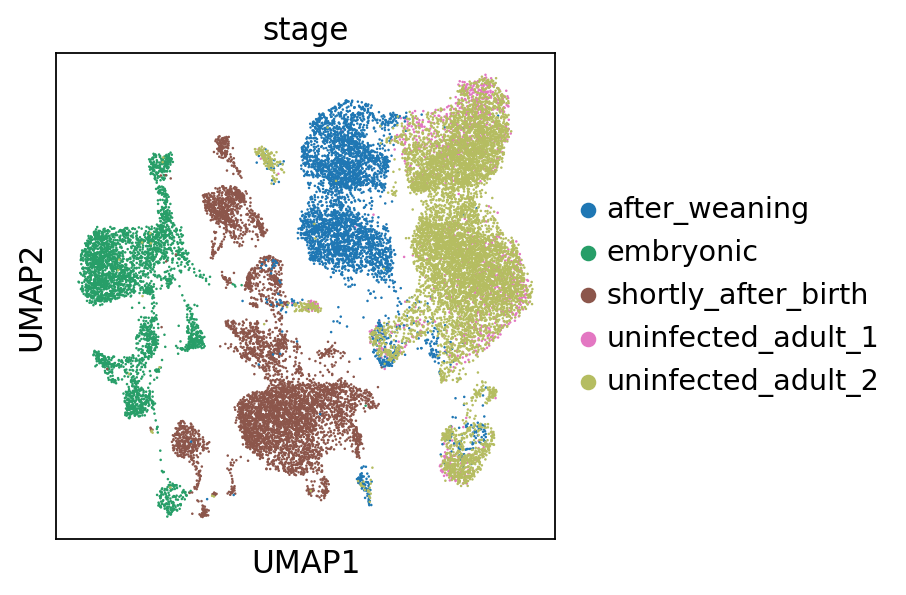

In [18]:
sc.pl.umap(adata, color = "leiden", use_raw=False, legend_loc='on data')
sc.pl.umap(adata, color = "stage", use_raw=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:50)


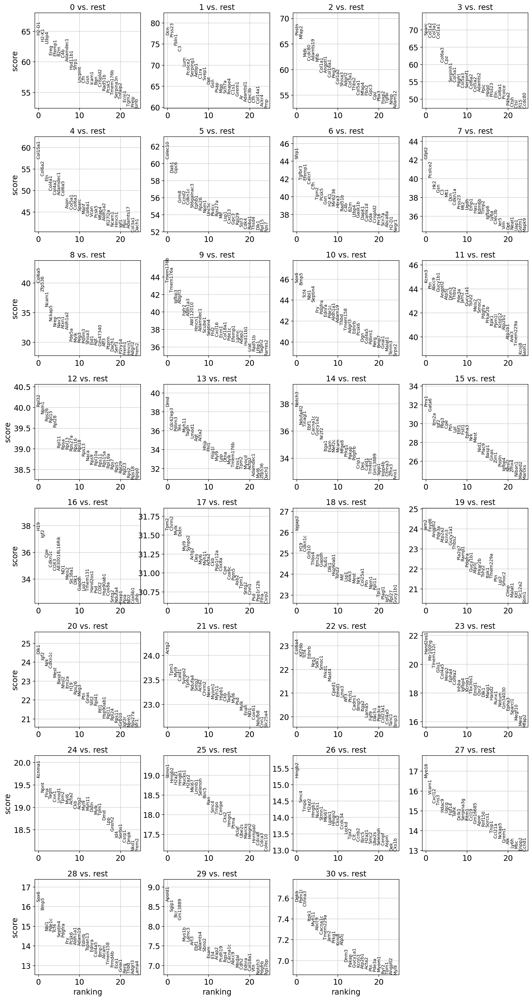

In [19]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon', use_raw = False, pts=True, )
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

ranking genes
--> Few observations in a group for normal approximation (<=25). Lower test accuracy.
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:09)


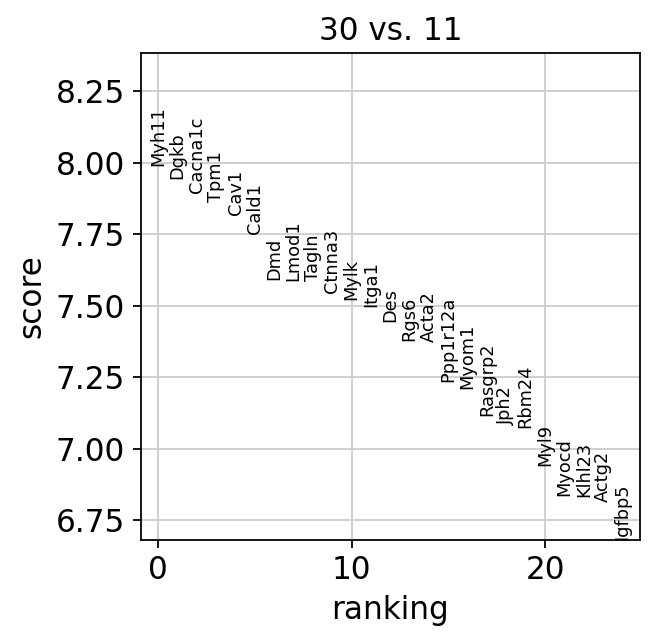

In [20]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon', use_raw = False, groups = ['30'], reference = '11')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

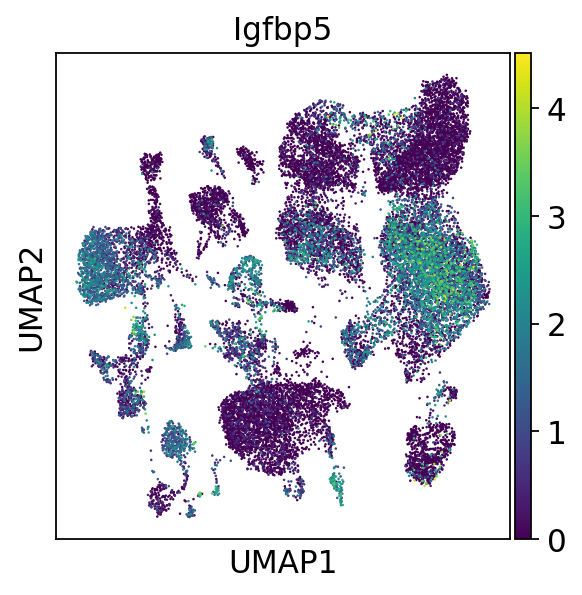

In [48]:
sc.pl.umap(adata, color = "Igfbp5", use_raw=False)

In [24]:
adata.obs['leiden_anno'] = adata.obs['leiden']
adata.obs['leiden_anno'].cat.categories = ['0/PdgfraloCD55+ FB', 
                                           '1/Cd81+ FB', 
                                           '2/Colec10hi FB', 
                                           '3/Cd81+ FB', 
                                           '4/PdgfraloCd55+ FB', 
                                           '5/Colec10hi FB', 
                                           '6/PdgfraloCd55+ FB', 
                                           '7/Cd81+ FB', 
                                           '8/Colec10+Ccl11+ FB',
                                           '9/Pdgfralo FB',
                                           '10/Pdgfrahi FB',
                                           '11/PdgfrahiJam2+_1 FB',
                                           '12/Colec10+Ccl11+ FB',
                                           '13/Ccl11+ MF',
                                           '14/Pericytes',
                                           '15/PdgfraloIgf2hi FB',
                                           '16/PdgfraloIgf2hi_1 FB',
                                           '17/Ccl11-Osr1+ MF',
                                           '18/PdgfraloIgf2hi_2 FB',
                                           '19/PdgfrahiJam2+ FB',
                                           '20/PdgfraloIgf2hi_3 FB',
                                           '21/Ccl11-Actg2hi MF', 
                                           '22/Pdgfrahi FB',
                                           '23/PdgfraloGlis1+ FB', 
                                           '24/Ccl11- MF', 
                                           '25/Colec10+_prolif. FB', 
                                           '26/Colec10+_prolif. FB', 
                                           '27/ILF FB', 
                                           '28/PdgfrahiCd55+ FB',
                                           '29/PdgfraloCd55+ FB',
                                           '30/PdgfrahiJam2+_2 FB',]

In [26]:
cl_16 = adata.obs['leiden_anno'].isin(['16/PdgfraloIgf2hi_1 FB'])

# Subset the AnnData object
adata_cl_16 = adata[cl_16].copy()

print(adata_cl_16.obs['leiden_anno'].cat.categories)

Index(['16/PdgfraloIgf2hi_1 FB'], dtype='object')


In [27]:
sc.pp.highly_variable_genes(adata_cl_16, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


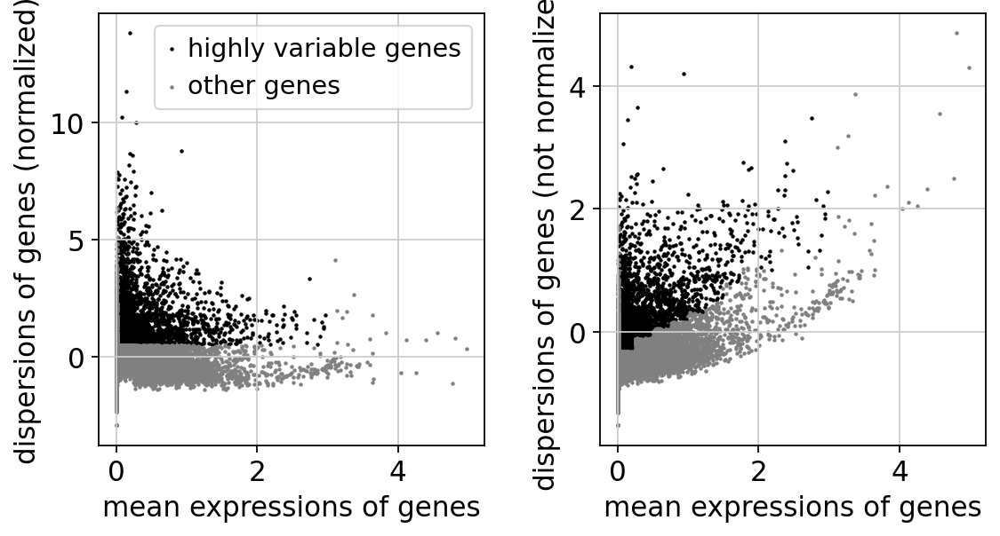

In [28]:
sc.pl.highly_variable_genes(adata_cl_16)

In [29]:
sc.tl.pca(adata_cl_16, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


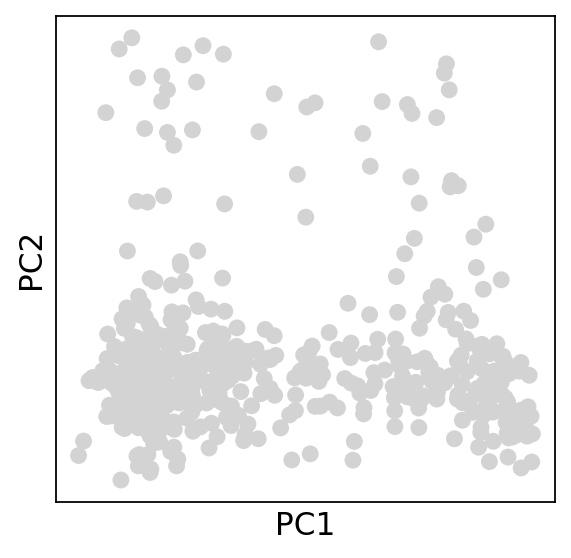

In [30]:
sc.pl.pca(adata_cl_16)

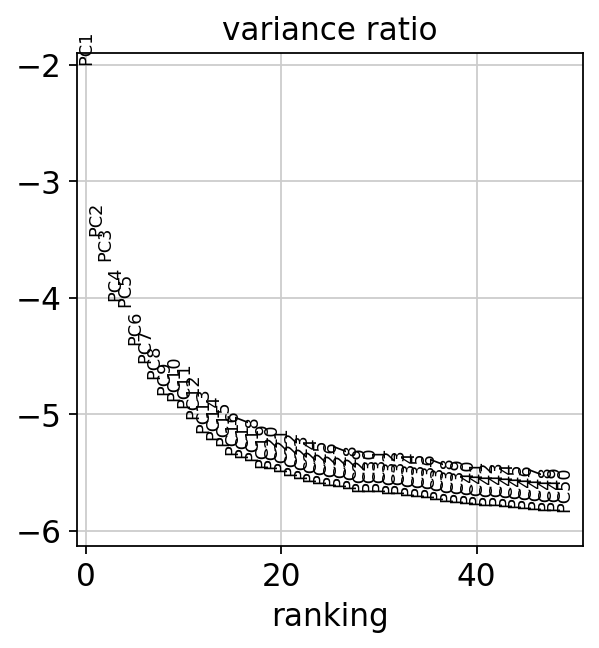

In [31]:
sc.pl.pca_variance_ratio(adata_cl_16, log=True, n_pcs=50)

In [42]:
sc.pp.neighbors(adata_cl_16, n_neighbors=10, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [43]:
sc.tl.umap(adata_cl_16)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


In [44]:
sc.tl.leiden(adata_cl_16, resolution=0.1)

running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [45]:
sc.tl.paga(adata_cl_16)
sc.pl.paga(adata_cl_16, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata_cl_16, init_pos='paga', min_dist=0.6)

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


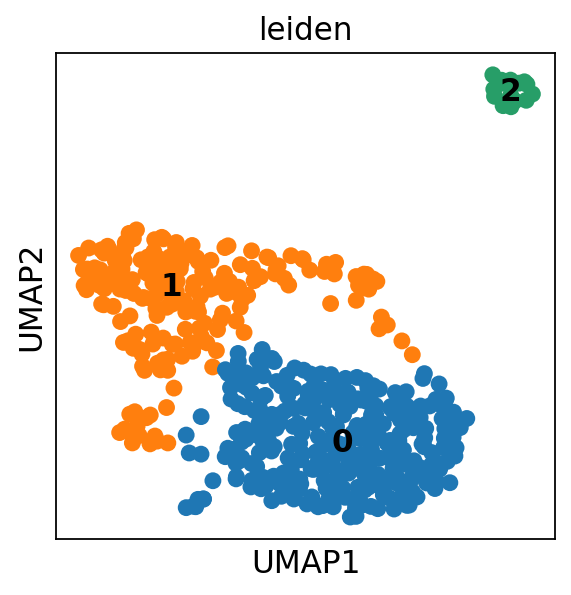

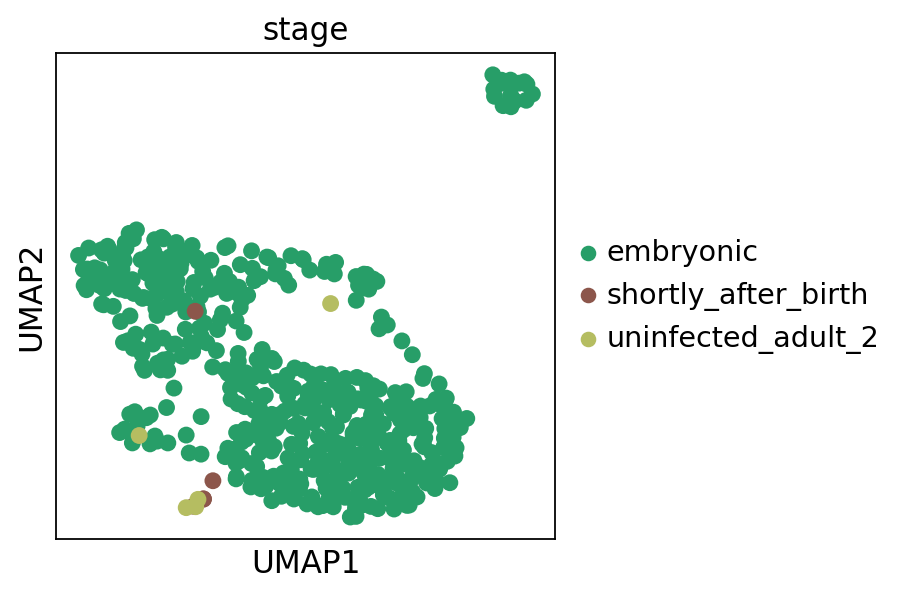

In [46]:
sc.pl.umap(adata_cl_16, color = "leiden", use_raw=False, legend_loc='on data')
sc.pl.umap(adata_cl_16, color = "stage", use_raw=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


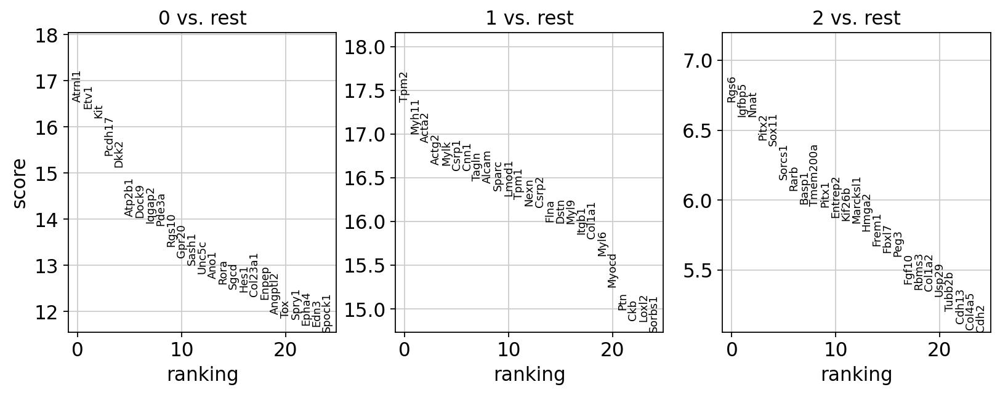

In [47]:
sc.tl.rank_genes_groups(adata_cl_16, 'leiden', method='wilcoxon', use_raw = False, pts=True, )
sc.pl.rank_genes_groups(adata_cl_16, n_genes=25, sharey=False)

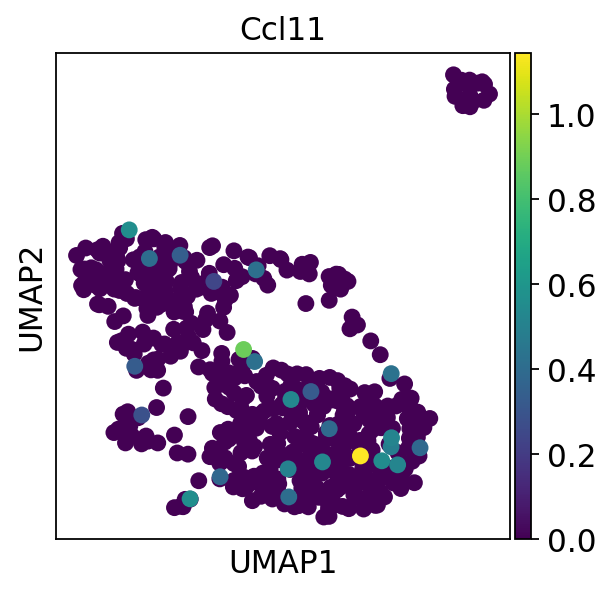

In [60]:
sc.pl.umap(adata_cl_16, color = "Ccl11", use_raw=False)

In [53]:
myofibroblasts_in_cl16 = adata_cl_16.obs_names[adata_cl_16.obs['leiden'] == "1"]
myofibroblasts_in_cl16

Index(['34691', '34695', '34729', '34734', '34775', '34856', '34859', '34861',
       '34914', '34933',
       ...
       '40007', '40012', '40048', '40064', '40095', '40098', '40128', '46457',
       '55725', '62828'],
      dtype='object', length=192)

In [55]:
# Check if the category already exists; if not, add it
if 'Ccl11-Osr1+ MF' not in adata.obs['leiden_anno'].cat.categories:
    adata.obs['leiden_anno'].cat.add_categories(['Ccl11-Osr1+ MF'], inplace=True)

adata.obs.loc[myofibroblasts_in_cl16, 'leiden_anno'] = 'Ccl11-Osr1+ MF'

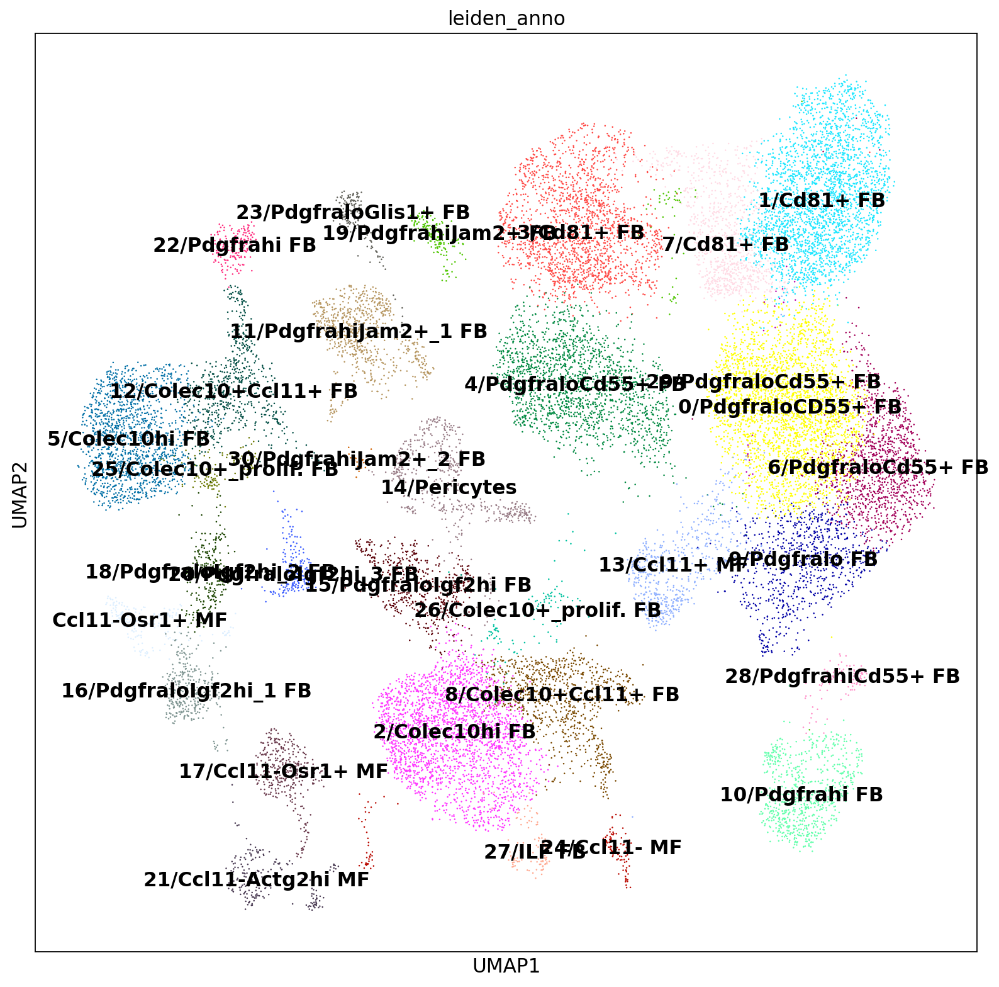

In [58]:
with rc_context({'figure.figsize': (12, 12)}):
    sc.pl.umap(adata, color = "leiden_anno", use_raw=False, legend_loc='on data')

In [61]:
cl_12 = adata.obs['leiden_anno'].isin(['12/Colec10+Ccl11+ FB'])

# Subset the AnnData object
adata_cl_12 = adata[cl_12].copy()

print(adata_cl_12.obs['leiden_anno'].cat.categories)

Index(['12/Colec10+Ccl11+ FB'], dtype='object')


In [62]:
sc.pp.highly_variable_genes(adata_cl_12, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


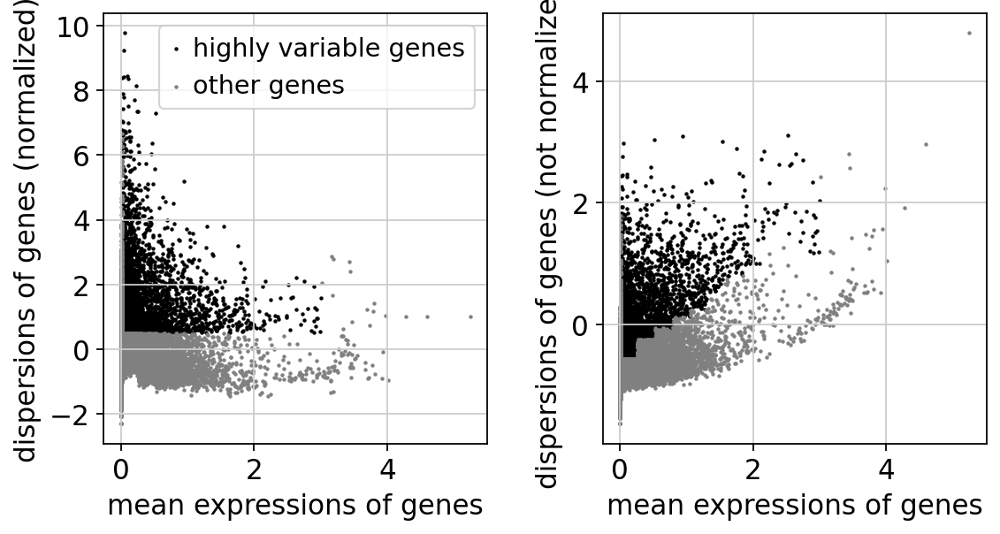

In [63]:
sc.pl.highly_variable_genes(adata_cl_12)

In [64]:
sc.tl.pca(adata_cl_12, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


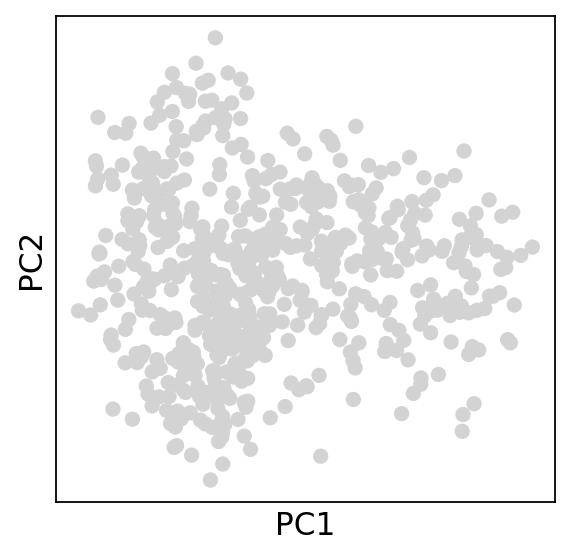

In [65]:
sc.pl.pca(adata_cl_12)

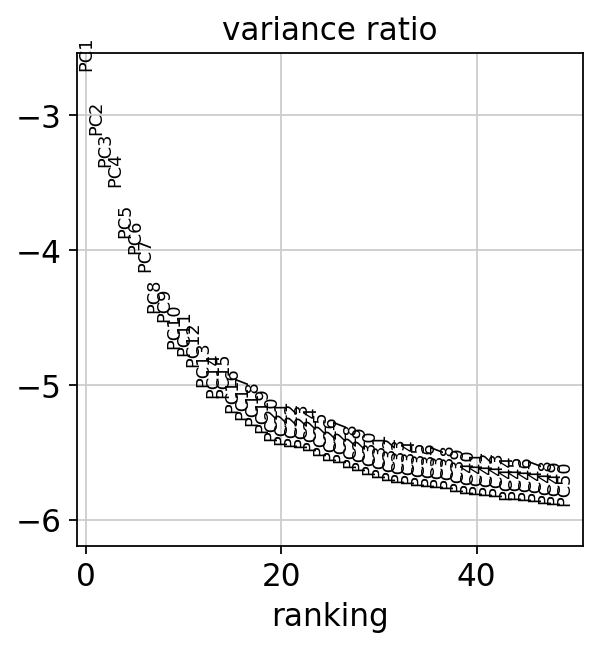

In [66]:
sc.pl.pca_variance_ratio(adata_cl_12, log=True, n_pcs=50)

In [67]:
sc.pp.neighbors(adata_cl_12, n_neighbors=10, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [68]:
sc.tl.umap(adata_cl_12)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


In [69]:
sc.tl.leiden(adata_cl_12, resolution=0.1)

running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [70]:
sc.tl.paga(adata_cl_12)
sc.pl.paga(adata_cl_12, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata_cl_12, init_pos='paga', min_dist=0.6)

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


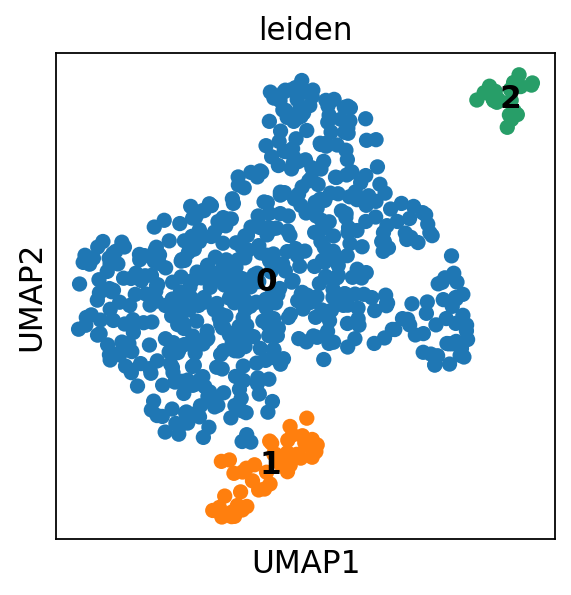

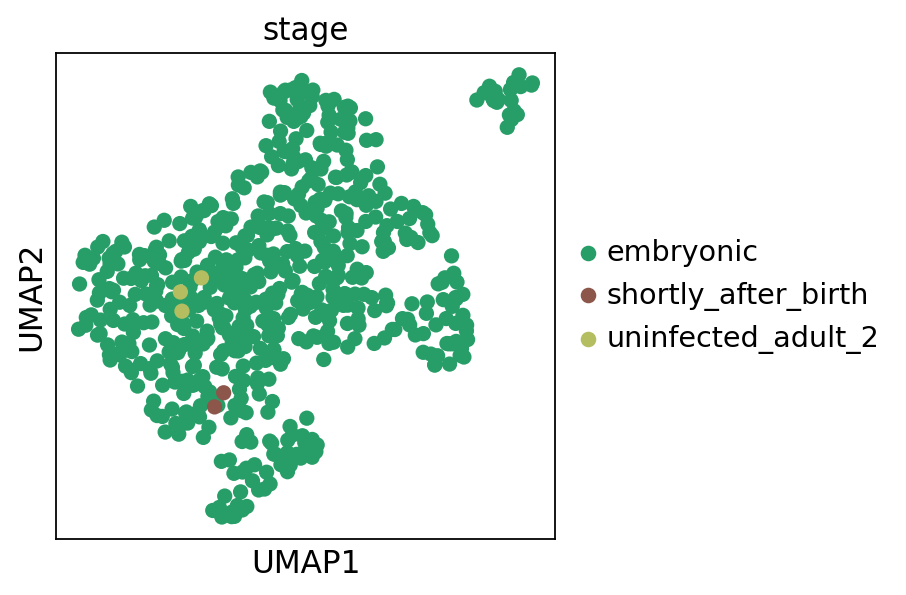

In [71]:
sc.pl.umap(adata_cl_12, color = "leiden", use_raw=False, legend_loc='on data')
sc.pl.umap(adata_cl_12, color = "stage", use_raw=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


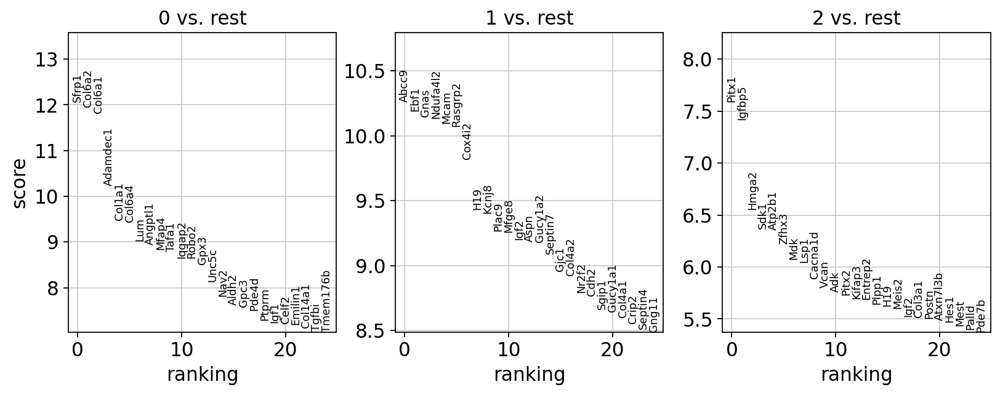

In [72]:
sc.tl.rank_genes_groups(adata_cl_12, 'leiden', method='wilcoxon', use_raw = False, pts=True, )
sc.pl.rank_genes_groups(adata_cl_12, n_genes=25, sharey=False)

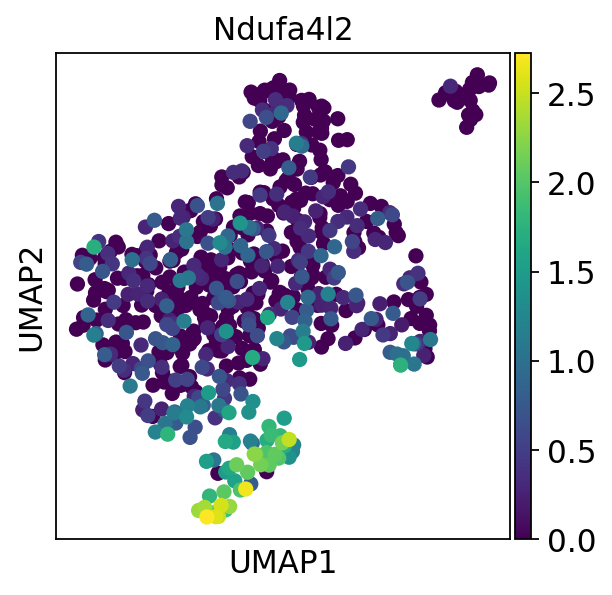

In [76]:
sc.pl.umap(adata_cl_12, color = "Ndufa4l2", use_raw=False)

In [78]:
pericytes_in_cl12 = adata_cl_12.obs_names[adata_cl_12.obs['leiden'] == "1"]
pericytes_in_cl12

Index(['35109', '35140', '35348', '35512', '35619', '35747', '36017', '36245',
       '36362', '36365', '36469', '36485', '36704', '36752', '36757', '36772',
       '36941', '37149', '37239', '37242', '37243', '37435', '37443', '37541',
       '37685', '37744', '37954', '38066', '38138', '38319', '38606', '38642',
       '38712', '38950', '39020', '39151', '39197', '39246', '39626', '39748',
       '39861', '39901', '39935', '39941'],
      dtype='object')

In [79]:
# Check if the category already exists; if not, add it
if 'Pericytes' not in adata.obs['leiden_anno'].cat.categories:
    adata.obs['leiden_anno'].cat.add_categories(['Pericytes'], inplace=True)

adata.obs.loc[pericytes_in_cl12, 'leiden_anno'] = 'Pericytes'

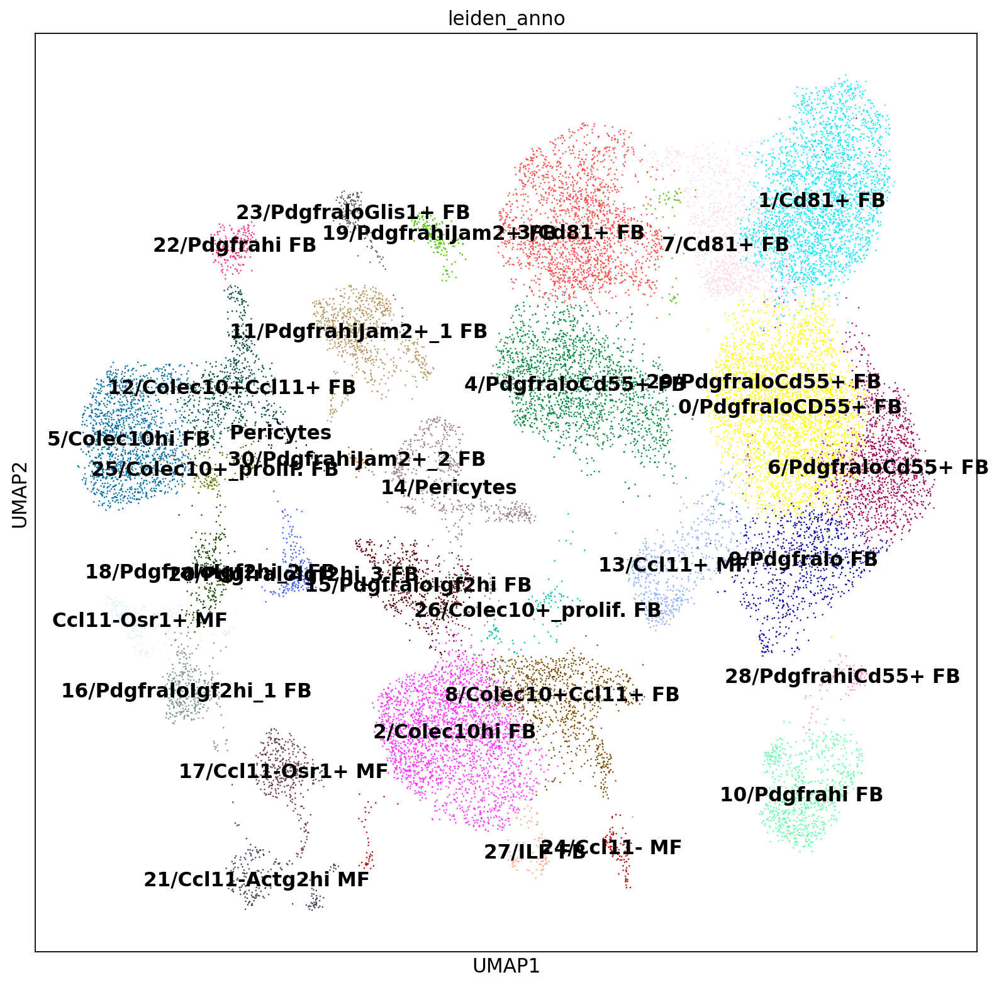

In [80]:
with rc_context({'figure.figsize': (12, 12)}):
    sc.pl.umap(adata, color = "leiden_anno", use_raw=False, legend_loc='on data')

In [81]:
# Strip the numbers and the slash from the beginning of each category
# Regular expression explanation:
# '^\d+/' - ^ means start of the string, \d+ matches one or more digits, and / matches the slash.
adata.obs['identity'] = adata.obs['leiden_anno'].str.replace('^\d+/', '', regex=True)

# Preview the new 'identity' column
print(adata.obs[['leiden_anno', 'identity']].head())

# Convert 'identity' to categorical type
adata.obs['identity'] = adata.obs['identity'].astype('category')

          leiden_anno          identity
0  6/PdgfraloCd55+ FB  PdgfraloCd55+ FB
1          1/Cd81+ FB          Cd81+ FB
3          1/Cd81+ FB          Cd81+ FB
4  0/PdgfraloCD55+ FB  PdgfraloCD55+ FB
6          7/Cd81+ FB          Cd81+ FB


In [83]:
# Define the mapping from stages to suffixes
stage_suffix_map = {
    'uninfected_adult_1': '_AD',
    'uninfected_adult_2': '_AD',
    'embryonic': '_EB',
    'shortly_after_birth': '_NB',
    'after_weaning': '_AW'
}

# Apply the mapping to create the 'identity_stage' column
adata.obs['identity_stage'] = adata.obs['identity'].astype(str) + adata.obs['stage'].map(stage_suffix_map)

# Preview the new 'identity_stage' column along with the 'identity' and 'stage' columns
print(adata.obs[['identity', 'stage', 'identity_stage']].head())

# Check for any stages that weren't mapped (if any)
print(adata.obs['identity_stage'].isna().sum())

           identity               stage       identity_stage
0  PdgfraloCd55+ FB  uninfected_adult_1  PdgfraloCd55+ FB_AD
1          Cd81+ FB  uninfected_adult_1          Cd81+ FB_AD
3          Cd81+ FB  uninfected_adult_1          Cd81+ FB_AD
4  PdgfraloCD55+ FB  uninfected_adult_1  PdgfraloCD55+ FB_AD
6          Cd81+ FB  uninfected_adult_1          Cd81+ FB_AD
0


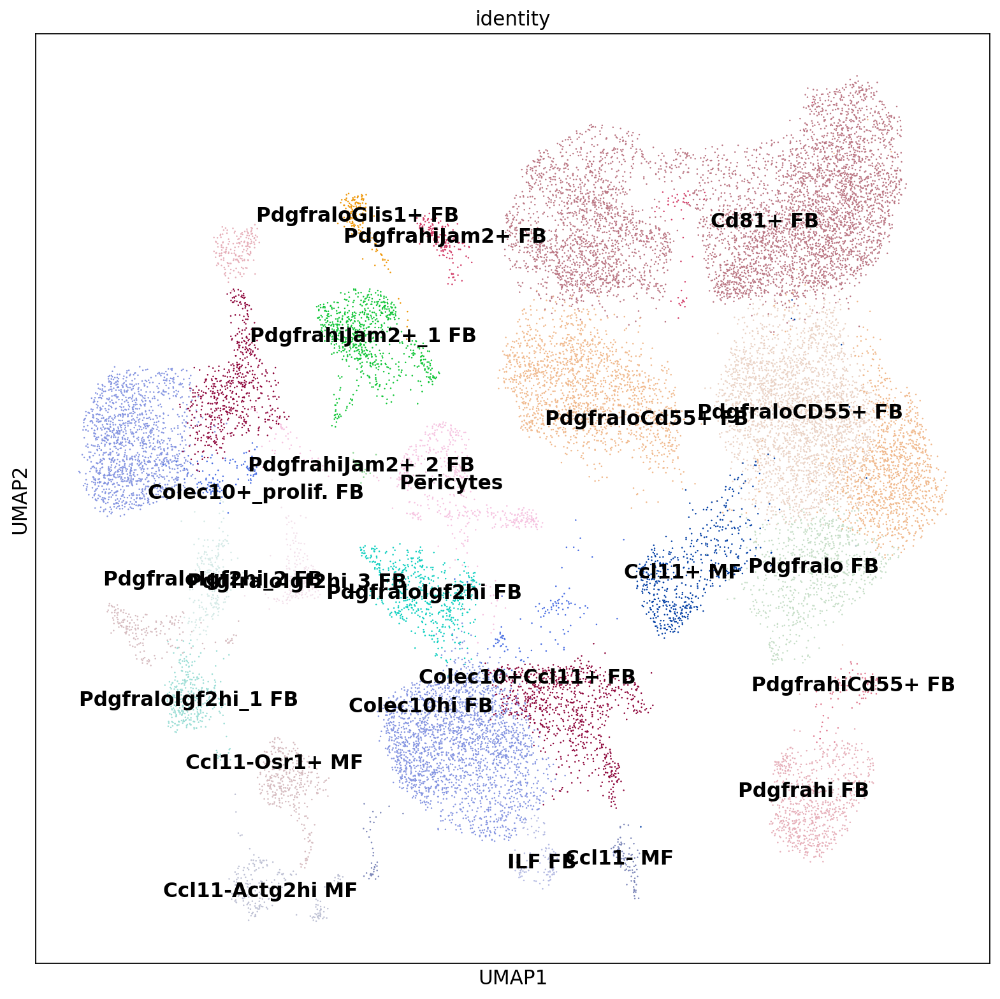

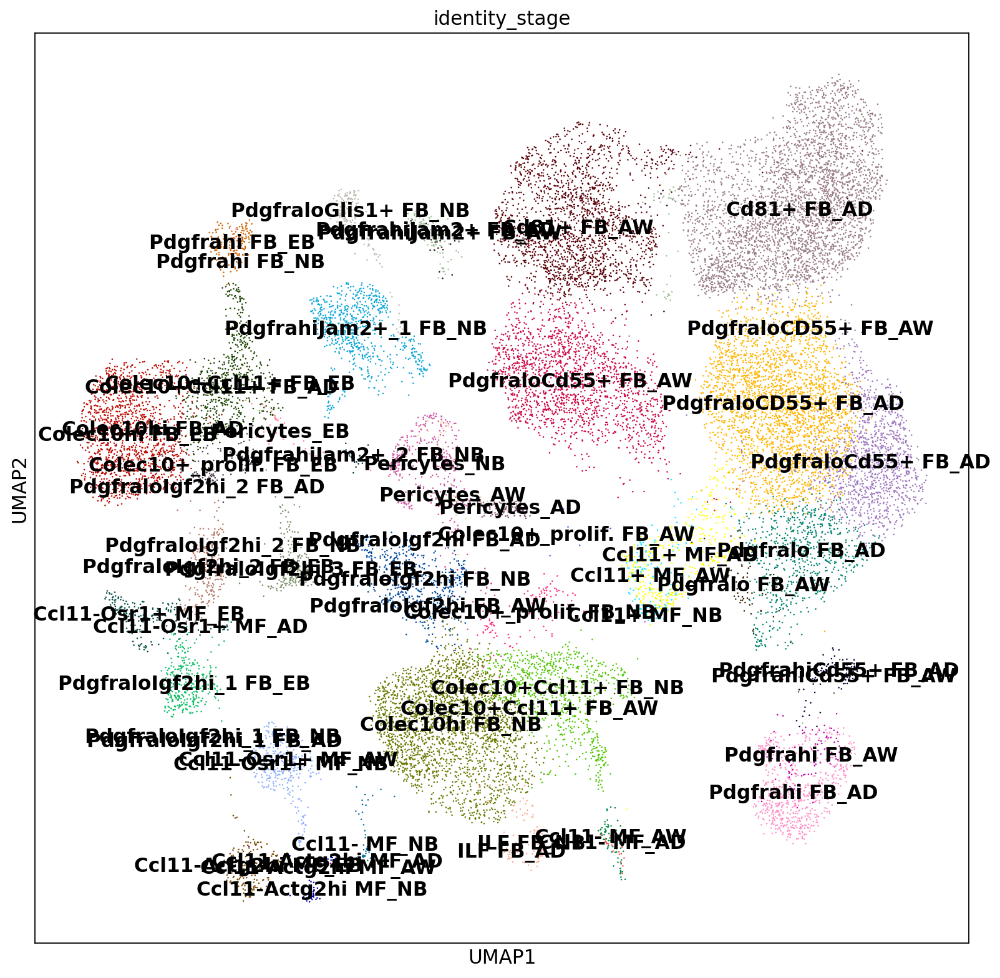

In [84]:
with rc_context({'figure.figsize': (12, 12)}):
    sc.pl.umap(adata, color = "identity", use_raw=False, legend_loc='on data')
    
with rc_context({'figure.figsize': (12, 12)}):
    sc.pl.umap(adata, color = "identity_stage", use_raw=False, legend_loc='on data')

In [85]:
adata.obs['stage_grouped'] = np.where(adata.obs['stage'].isin(['uninfected_adult_1', 'uninfected_adult_2']), 
                                     'uninfected_adult', 
                                     adata.obs['stage'])

# Convert 'stage_grouped' to a categorical type
adata.obs['stage_grouped'] = pd.Categorical(adata.obs['stage_grouped'])

In [86]:
sc.tl.score_genes_cell_cycle(adata, s_genes=S_genes_list, g2m_genes=G2M_genes_list, use_raw=False) #gene_pool=unique_genes_list

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    409 total control genes are used. (0:00:02)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    409 total control genes are used. (0:00:02)
-->     'phase', cell cycle phase (adata.obs)


In [87]:
adata.write_h5ad("/vol/ExtraVol/Ontogeny_Clustered.h5ad") 

In [88]:
adata

AnnData object with n_obs × n_vars = 23004 × 40879
    obs: 'Unnamed: 0', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Sample_ID', 'stage', 'percent.mt', 'CellName', 'doublet_finder', 'Doublet_classification', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_anno', 'identity', 'identity_stage', 'stage_grouped', 'S_score', 'G2M_score', 'phase'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'pca', 'stage_colors', 'umap', 'rank_genes_groups', 'leiden_anno_colors', 'identity_colors', 'identity_stage_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts'
    obsp: 'connectivities', 'distances'

In [89]:
t=adata.X
df_normalized = pd.DataFrame(data=t, index=adata.obs["CellName"], columns=adata.var_names)
df_normalized

,Gm26206,Xkr4,Gm53491,Rp1,Sox17,Gm22307,Gm37323,Gm39586,Gm46082,Gm29874,...,ND4,TrnH,TrnS2,TrnL2,ND5,ND6,TrnE,CYTB,TrnT,TrnP
CellName,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGTATCTGC-1_1,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.278196,0.000000,0.359544,0.0,1.954085,0.359544,0.000000,3.643100,0.359544,0.000000
AAACCCACATGACTGT-1_1,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.574454,0.000000,0.339424,0.0,2.249913,0.000000,0.000000,3.015468,0.000000,0.000000
AAAGGATTCCAAACCA-1_1,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.111631,0.553838,0.000000,0.0,1.821226,1.169306,0.000000,3.513228,0.000000,0.908193
AAAGGGCAGTCTACCA-1_1,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.211056,0.000000,0.000000,0.0,1.519686,0.000000,0.000000,3.518454,0.000000,0.000000
AAAGGTACACCACATA-1_1,0.0,1.664111,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.096170,0.305091,0.305091,0.0,1.664111,0.538536,0.000000,2.396889,0.000000,0.305091
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTAGTGATA-1_8,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.656632,0.000000,0.000000,0.0,1.859376,0.000000,0.000000,2.947894,0.000000,0.000000
TTTGTTGTCACATCAG-1_8,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.168210,0.000000,0.000000,0.0,1.121527,0.000000,0.000000,3.382902,0.000000,0.000000
TTTGTTGTCAGGACGA-1_8,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.990399,0.000000,0.000000,0.0,1.507426,0.000000,0.000000,3.537864,0.000000,0.000000


In [90]:
df_normalized.to_csv('/vol/ExtraVol/Ontogeny_Clustered_normalized.csv')

In [91]:
t=adata.layers["raw_counts"]
df_raw = pd.DataFrame(data=t, index=adata.obs["CellName"], columns=adata.var_names)
df_raw

,Gm26206,Xkr4,Gm53491,Rp1,Sox17,Gm22307,Gm37323,Gm39586,Gm46082,Gm29874,...,ND4,TrnH,TrnS2,TrnL2,ND5,ND6,TrnE,CYTB,TrnT,TrnP
CellName,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGTATCTGC-1_1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,59.0,0.0,1.0,0.0,14.0,1.0,0.0,86.0,1.0,0.0
AAACCCACATGACTGT-1_1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,30.0,0.0,1.0,0.0,21.0,0.0,0.0,48.0,0.0,0.0
AAAGGATTCCAAACCA-1_1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,29.0,1.0,0.0,0.0,7.0,3.0,0.0,44.0,0.0,2.0
AAAGGGCAGTCTACCA-1_1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,40.0,0.0,0.0,0.0,6.0,0.0,0.0,55.0,0.0,0.0
AAAGGTACACCACATA-1_1,0.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,20.0,1.0,1.0,0.0,12.0,2.0,0.0,28.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTAGTGATA-1_8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,22.0,0.0,0.0,0.0,9.0,0.0,0.0,30.0,0.0,0.0
TTTGTTGTCACATCAG-1_8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,44.0,0.0,0.0,0.0,4.0,0.0,0.0,55.0,0.0,0.0
TTTGTTGTCAGGACGA-1_8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,43.0,0.0,0.0,0.0,8.0,0.0,0.0,76.0,0.0,0.0


In [92]:
df_raw.to_csv('/vol/ExtraVol/Ontogeny_Clustered_raw.csv')

In [93]:
adata.obsm["X_umap"]

array([[16.3899   ,  3.8713999],
       [15.634364 , 14.0542145],
       [13.854516 , 11.951503 ],
       ...,
       [15.501664 ,  6.7054324],
       [14.032215 ,  7.586985 ],
       [11.942544 ,  6.5549736]], dtype=float32)

In [94]:
umap_df = pd.DataFrame(adata.obsm["X_umap"], index=adata.obs_names)
umap_df.columns = ['UMAP_1', 'UMAP_2']
umap_df

,UMAP_1,UMAP_2
0,16.389900,3.871400
1,15.634364,14.054214
3,13.854516,11.951503
4,10.607970,6.494165
6,10.879409,13.063945
...,...,...
62869,11.650346,5.636230
62870,14.682453,4.644402
62871,15.501664,6.705432
62872,14.032215,7.586985


In [95]:
metadata_df = merged_df = pd.concat([umap_df, adata.obs], axis=1)
metadata_df

,UMAP_1,UMAP_2,Unnamed: 0,orig.ident,nCount_RNA,nFeature_RNA,Sample_ID,stage,percent.mt,CellName,...,total_counts_mt,pct_counts_mt,leiden,leiden_anno,identity,identity_stage,stage_grouped,S_score,G2M_score,phase
0,16.389900,3.871400,AAACCCAAGTATCTGC-1_1,23L002443,23112,5661,S1,uninfected_adult_1,1.691762,AAACCCAAGTATCTGC-1_1,...,391.0,1.691762,6,6/PdgfraloCd55+ FB,PdgfraloCd55+ FB,PdgfraloCd55+ FB_AD,uninfected_adult,-0.127610,-0.128703,G1
1,15.634364,14.054214,AAACCCACATGACTGT-1_1,23L002443,24744,5161,S1,uninfected_adult_1,0.832525,AAACCCACATGACTGT-1_1,...,206.0,0.832525,1,1/Cd81+ FB,Cd81+ FB,Cd81+ FB_AD,uninfected_adult,-0.115378,-0.151866,G1
3,13.854516,11.951503,AAAGGATTCCAAACCA-1_1,23L002443,13515,3817,S1,uninfected_adult_1,0.606733,AAAGGATTCCAAACCA-1_1,...,82.0,0.606733,1,1/Cd81+ FB,Cd81+ FB,Cd81+ FB_AD,uninfected_adult,-0.091672,-0.113446,G1
4,10.607970,6.494165,AAAGGGCAGTCTACCA-1_1,23L002443,16803,4118,S1,uninfected_adult_1,1.487830,AAAGGGCAGTCTACCA-1_1,...,250.0,1.487830,0,0/PdgfraloCD55+ FB,PdgfraloCD55+ FB,PdgfraloCD55+ FB_AD,uninfected_adult,-0.081151,-0.138820,G1
6,10.879409,13.063945,AAAGGTACACCACATA-1_1,23L002443,28031,5205,S1,uninfected_adult_1,1.091649,AAAGGTACACCACATA-1_1,...,306.0,1.091649,7,7/Cd81+ FB,Cd81+ FB,Cd81+ FB_AD,uninfected_adult,-0.076287,-0.103149,G1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62869,11.650346,5.636230,TTTGTTGGTAGTGATA-1_8,23L002450,16606,3751,S8,uninfected_adult_2,1.192340,TTTGTTGGTAGTGATA-1_8,...,198.0,1.192340,0,0/PdgfraloCD55+ FB,PdgfraloCD55+ FB,PdgfraloCD55+ FB_AD,uninfected_adult,-0.129201,-0.158275,G1
62870,14.682453,4.644402,TTTGTTGTCACATCAG-1_8,23L002450,19328,4592,S8,uninfected_adult_2,1.728063,TTTGTTGTCACATCAG-1_8,...,334.0,1.728063,6,6/PdgfraloCd55+ FB,PdgfraloCd55+ FB,PdgfraloCd55+ FB_AD,uninfected_adult,-0.097627,-0.179844,G1
62871,15.501664,6.705432,TTTGTTGTCAGGACGA-1_8,23L002450,22759,5305,S8,uninfected_adult_2,1.274221,TTTGTTGTCAGGACGA-1_8,...,290.0,1.274221,6,6/PdgfraloCd55+ FB,PdgfraloCd55+ FB,PdgfraloCd55+ FB_AD,uninfected_adult,-0.206179,-0.160876,G1
62872,14.032215,7.586985,TTTGTTGTCCCATAAG-1_8,23L002450,20598,4859,S8,uninfected_adult_2,1.004952,TTTGTTGTCCCATAAG-1_8,...,207.0,1.004952,0,0/PdgfraloCD55+ FB,PdgfraloCD55+ FB,PdgfraloCD55+ FB_AD,uninfected_adult,-0.120342,-0.165996,G1


In [96]:
metadata_df.to_csv('/vol/ExtraVol/Ontogeny_Clustered_Metadata.csv')

In [104]:
sc.tl.rank_genes_groups(adata, 'identity', method='wilcoxon', use_raw = False, pts=True, )
diffexp_df = sc.get.rank_genes_groups_df(adata, key='rank_genes_groups', group=None)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:18)


In [105]:
diffexp_df

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,Ccl11+ MF,Dmd,38.584797,4.538655,0.000000e+00,0.000000e+00,0.998211,0.643306
1,Ccl11+ MF,Cdc42ep3,36.139599,3.821639,5.419928e-286,1.107806e-281,0.969589,0.388550
2,Ccl11+ MF,Pdlim3,36.003059,4.131713,7.492080e-284,1.020896e-279,0.971377,0.325061
3,Ccl11+ MF,Tes,35.985832,4.404791,1.393577e-283,1.424200e-279,0.942755,0.263845
4,Ccl11+ MF,Myh11,35.886547,5.094458,4.952666e-282,4.049201e-278,0.987478,0.272176
...,...,...,...,...,...,...,...,...
940212,Pericytes,Dcn,-36.584248,-5.478614,5.091993e-293,2.081556e-289,0.637961,0.974905
940213,Pericytes,Clmp,-36.585503,-4.918223,4.863692e-293,2.081556e-289,0.100176,0.937419
940214,Pericytes,Celf2,-36.775761,-3.984111,4.506712e-296,2.302874e-292,0.442882,0.988010
940215,Pericytes,Sfrp1,-36.780872,-5.444660,3.733512e-296,2.180318e-292,0.205624,0.943303


In [106]:
diffexp_df.to_csv('/vol/ExtraVol/Ontogeny_ClusterMarkers_Wilcox.csv')

!!!THE END!!!

In [23]:
adata.uns['iroot'] = np.flatnonzero((adata.obs['stage'] == 'embryonic'))[0]
adata.uns['iterminal'] = np.flatnonzero((adata.obs['stage'] == 'uninfected_adult_2'))[0]

In [73]:
np.flatnonzero((adata.obs['stage'] == 'embryonic'))[3400]

4749

In [75]:
sc.tl.diffmap(adata, n_comps=50)

computing Diffusion Maps using n_comps=50(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9992337  0.9982378  0.99788547 0.99652797 0.996321
     0.9961428  0.9955378  0.99492466 0.9935063  0.992303   0.9919449
     0.99140656 0.9902638  0.9895085  0.9891622  0.98884743 0.9877388
     0.986041   0.98494846 0.98286295 0.98067665 0.98057604 0.9793144
     0.97846395 0.97702897 0.9761091  0.97461283 0.9738062  0.97089934
     0.96960574 0.9692013  0.9651919  0.9636269  0.9634548  0.96273845
     0.96214944 0.9611898  0.95861185 0.9569197  0.95613927 0.95488894
     0.95464325 0.9534844  0.952071   0.95001316 0.9479958  0.9477183
     0.9466848  0.94442284]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:01)


In [76]:
sc.tl.dpt(adata, n_dcs=50)

computing Diffusion Pseudotime using n_dcs=50
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


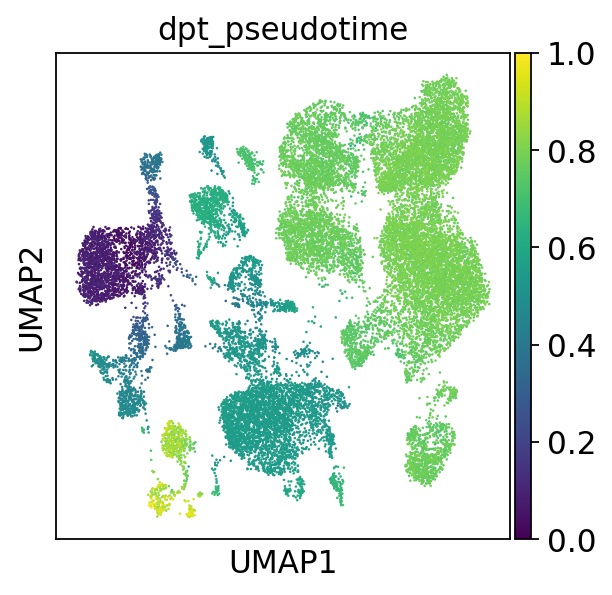

In [77]:
sc.pl.umap(adata, color=['dpt_pseudotime'], legend_loc='on data')

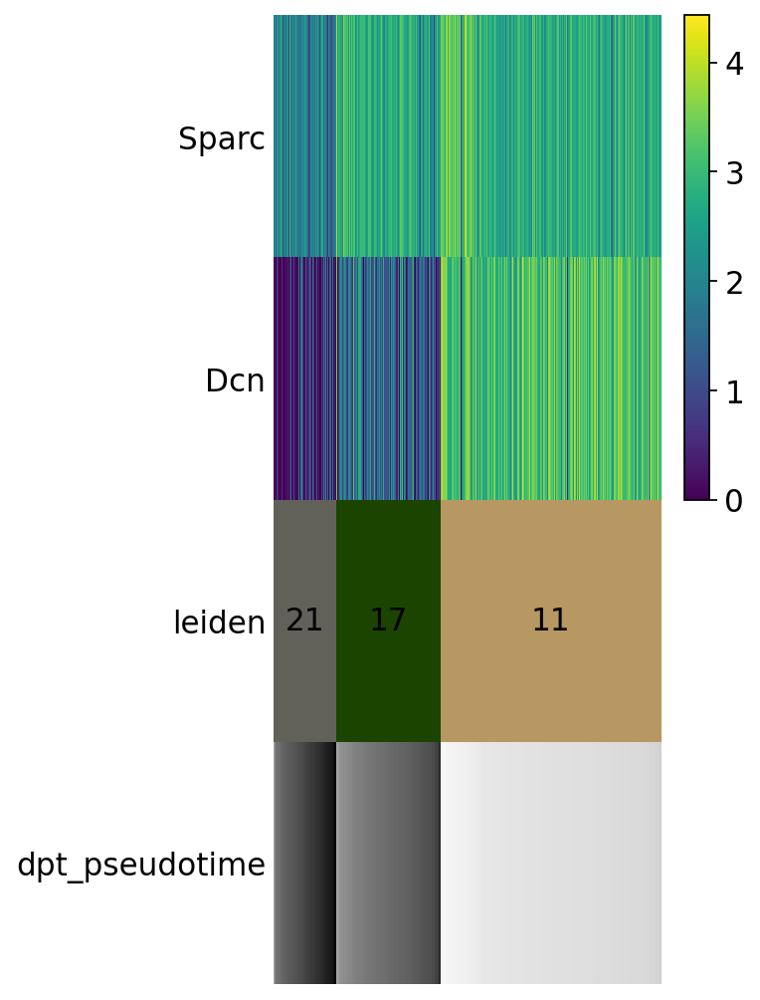

In [67]:
sc.pl.paga_path(adata, nodes=[21,17,11], keys=["Sparc","Dcn"], use_raw=False)

--> added 'pos', the PAGA positions (adata.uns['paga'])


<Axes: >

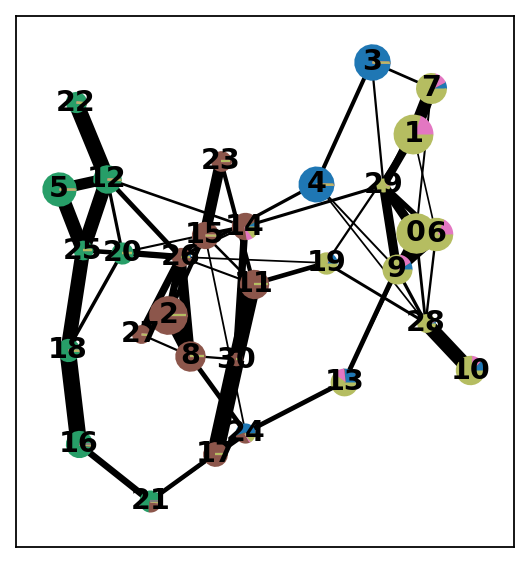

In [128]:
sc.pl.paga(adata, threshold=0.1, show=False, color = ['stage'])

In [24]:
velocity_embryonic = scv.read("/vol/MainVol/Project_663_scRNA_Seq_MSZP85_87/23L002447/velocyto/23L002447.loom", cache=True, validate = False)
velocity_newborn = scv.read("/vol/MainVol/Project_663_scRNA_Seq_MSZP85_87/23L002448/velocyto/23L002448.loom", cache=True, validate = False)
velocity_afterweaning = scv.read("/vol/MainVol/Project_663_scRNA_Seq_MSZP85_87/23L002449/velocyto/23L002449.loom", cache=True, validate = False)
velocity_adult = scv.read("/vol/MainVol/Project_663_scRNA_Seq_MSZP85_87/23L002450/velocyto/23L002450.loom", cache=True, validate = False)
velocity_uninfected = scv.read("/vol/MainVol/Project_663_scRNA_Seq_MSZP85_87/23L002443/velocyto/23L002443.loom", cache=True, validate = False)

... reading from cache file cache/vol-MainVol-Project_663_scRNA_Seq_MSZP85_87-23L002447-velocyto-23L002447.h5ad
... reading from cache file cache/vol-MainVol-Project_663_scRNA_Seq_MSZP85_87-23L002448-velocyto-23L002448.h5ad
... reading from cache file cache/vol-MainVol-Project_663_scRNA_Seq_MSZP85_87-23L002449-velocyto-23L002449.h5ad
... reading from cache file cache/vol-MainVol-Project_663_scRNA_Seq_MSZP85_87-23L002450-velocyto-23L002450.h5ad
... reading from cache file cache/vol-MainVol-Project_663_scRNA_Seq_MSZP85_87-23L002443-velocyto-23L002443.h5ad


In [25]:
velocity_development = ad.concat([velocity_embryonic,velocity_newborn,velocity_afterweaning,velocity_adult,velocity_uninfected], merge="same")
velocity_development

AnnData object with n_obs × n_vars = 35842 × 40879
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [26]:
# Convert 'CellName' and 'orig.ident' to string
adata.obs['CellName_str'] = adata.obs['CellName'].astype(str)
adata.obs['orig_ident_str'] = adata.obs['orig.ident'].astype(str)

# Replace the dash, numbers, and underscores at the end of CellName with "x"
adata.obs['ModifiedCellName'] = adata.obs['CellName_str'].str.replace(r'-.*$', 'x', regex=True)

# Create 'CellID' by joining modified 'CellName' and 'orig.ident' with a colon, ensure all parts are strings
adata.obs['CellID'] = adata.obs['orig_ident_str'] + ':' + adata.obs['ModifiedCellName']

# Optionally, convert 'CellID' back to categorical if needed
adata.obs['CellID'] = adata.obs['CellID'].astype('category')

# Display the result
print(adata.obs[['CellName', 'orig.ident', 'ModifiedCellName', 'CellID']].head())

               CellName orig.ident   ModifiedCellName  \
0  AAACCCAAGTATCTGC-1_1  23L002443  AAACCCAAGTATCTGCx   
1  AAACCCACATGACTGT-1_1  23L002443  AAACCCACATGACTGTx   
3  AAAGGATTCCAAACCA-1_1  23L002443  AAAGGATTCCAAACCAx   
4  AAAGGGCAGTCTACCA-1_1  23L002443  AAAGGGCAGTCTACCAx   
6  AAAGGTACACCACATA-1_1  23L002443  AAAGGTACACCACATAx   

                        CellID  
0  23L002443:AAACCCAAGTATCTGCx  
1  23L002443:AAACCCACATGACTGTx  
3  23L002443:AAAGGATTCCAAACCAx  
4  23L002443:AAAGGGCAGTCTACCAx  
6  23L002443:AAAGGTACACCACATAx  


In [27]:
adata.obs.set_index('CellID', inplace=True)

In [28]:
merged_obs = pd.merge(velocity_development.obs, adata.obs, left_index=True, right_index=True, how='inner')

In [29]:
# Ensure cells are in the same order for both objects
velocity_development = velocity_development[merged_obs.index]
adata = adata[merged_obs.index]

In [30]:
adata = scv.utils.merge(adata, velocity_development)

In [31]:
scv.pp.filter_genes(adata, min_counts = 10)
scv.pp.filter_genes(adata, min_cells = 100)
scv.pp.filter_and_normalize(adata)

Filtered out 19806 genes that are detected 10 counts (spliced).
Filtered out 5659 genes that are detected in less than 100 cells (spliced).
Normalized count data: spliced, unspliced.


/home/ubuntu/anaconda3/envs/scanpy/lib/python3.11/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


Logarithmized X.


In [ ]:
adata

In [32]:
scv.pp.moments(adata, n_pcs=50, n_neighbors=100)

#And then...
scv.tl.recover_dynamics(adata, n_jobs=20) #separately... (!!) takes around 4 m: 15:15-18

computing neighbors
    finished (0:00:24) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:01:31) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 20/28 cores)


  0%|          | 0/2516 [00:00<?, ?gene/s]

    finished (0:10:30) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [33]:
scv.tl.velocity(adata, mode="dynamical", use_latent_time = False) #separately as a oneliner, not in the 'cell'...
scv.tl.velocity_graph(adata) #separately... and the note in the next line the basis as 'umap' and not 'X_umap'

computing velocities
    finished (0:00:51) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/28 cores)


  0%|          | 0/23004 [00:00<?, ?cells/s]

    finished (0:04:51) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [38]:
adata.uns['iterminal'] = np.flatnonzero((adata.obs['stage'] == 'uninfected_adult_2'))[0]

In [39]:
scv.tl.latent_time(adata, root_key = "iroot", end_key = "iterminal")

computing terminal states
    identified 9 regions of root cells and 2 regions of end points .
    finished (0:00:21) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root cell 1349 as prior
    finished (0:00:13) --> added 
    'latent_time', shared time (adata.obs)


In [52]:
scv.tl.velocity_pseudotime(adata, root_key = "iroot", end_key = "iterminal")

--> added 'pos', the PAGA positions (adata.uns['paga'])
--> added 'pos', the PAGA positions (adata.uns['paga'])


<Axes: >

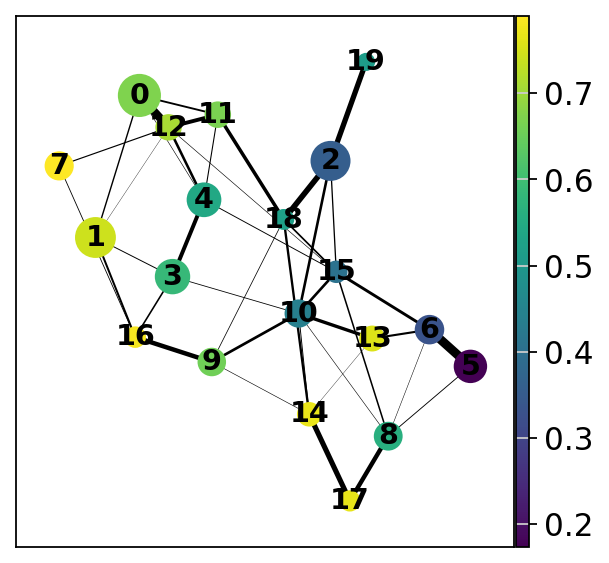

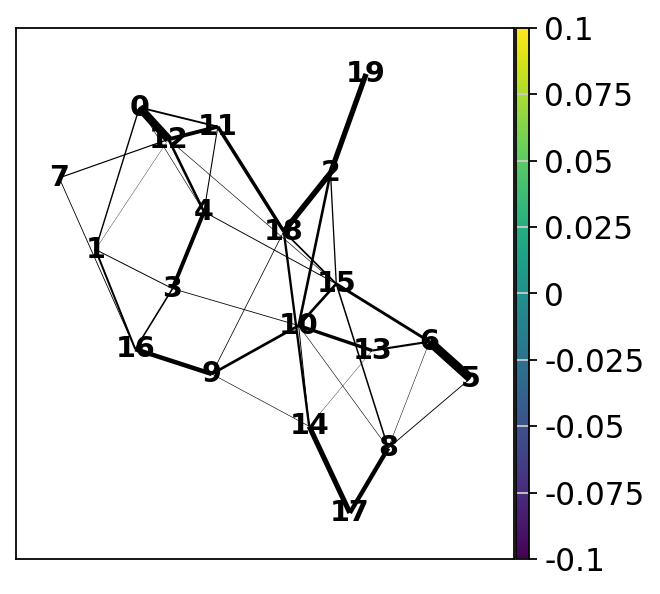

In [41]:
sc.pl.paga(adata, threshold=0.02, show=False, color = ['latent_time'])
sc.pl.paga(adata, threshold=0.02, show=False, color = ['velocity_pseudotime'])

/home/ubuntu/anaconda3/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


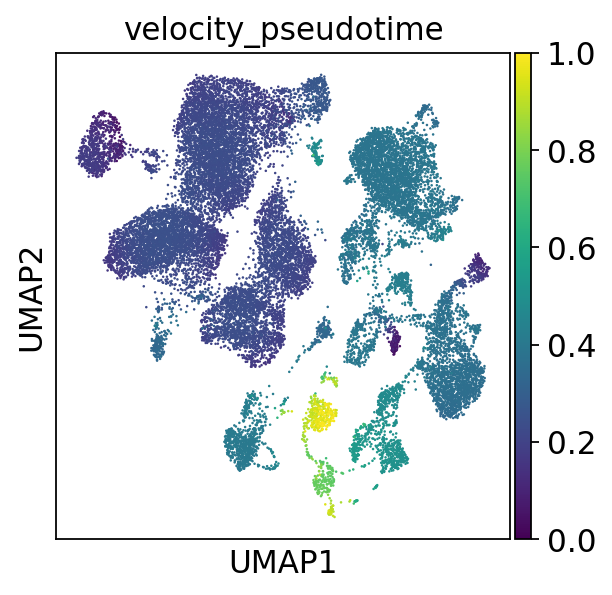

In [53]:
sc.pl.umap(adata, use_raw=False, color = ['velocity_pseudotime'])

In [46]:
scv.tl.paga(adata, )

running PAGA using priors: ['velocity_pseudotime']


AssertionError: 

<Axes: title={'center': 'paga (leiden)'}>

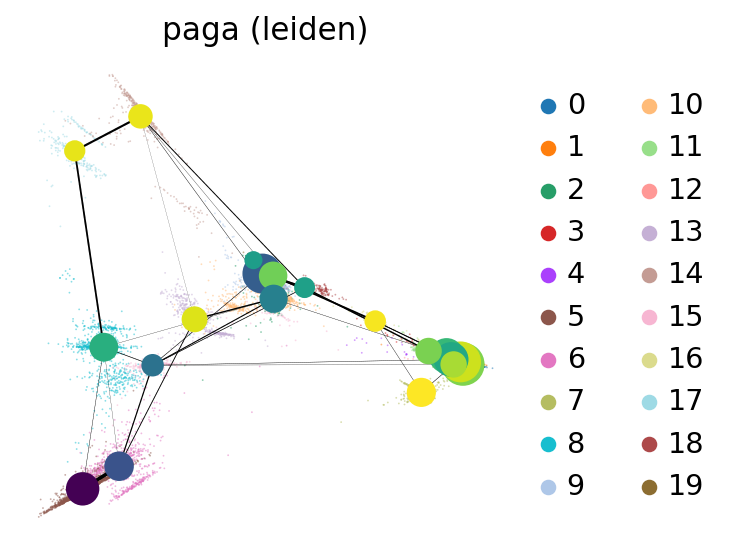

In [55]:
scv.pl.paga(adata, basis='diffmap', threshold=0.02, show=False, color = ['latent_time'])

computing velocity embedding
    finished (0:00:06) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


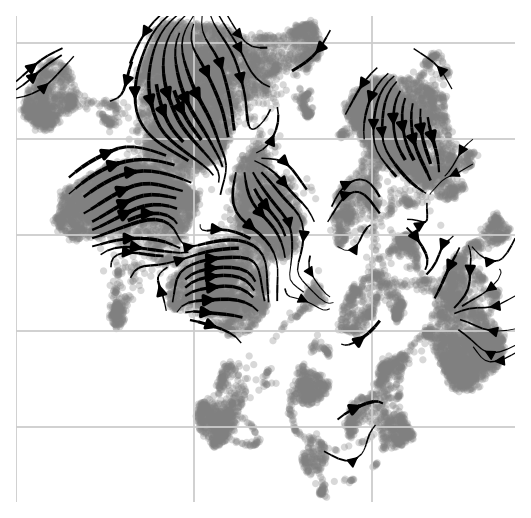

In [54]:
scv.pl.velocity_embedding_stream(adata, basis="umap", legend_fontsize=12, title="", 
                                 smooth=0.8, min_mass=4)

In [48]:
adata

AnnData object with n_obs × n_vars = 23004 × 40874
    obs: 'Unnamed: 0', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Sample_ID', 'stage', 'percent.mt', 'CellName', 'doublet_finder', 'Doublet_classification', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'dpt_pseudotime', 'CellName_str', 'orig_ident_str', 'ModifiedCellName', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes'
    uns: '

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:13)


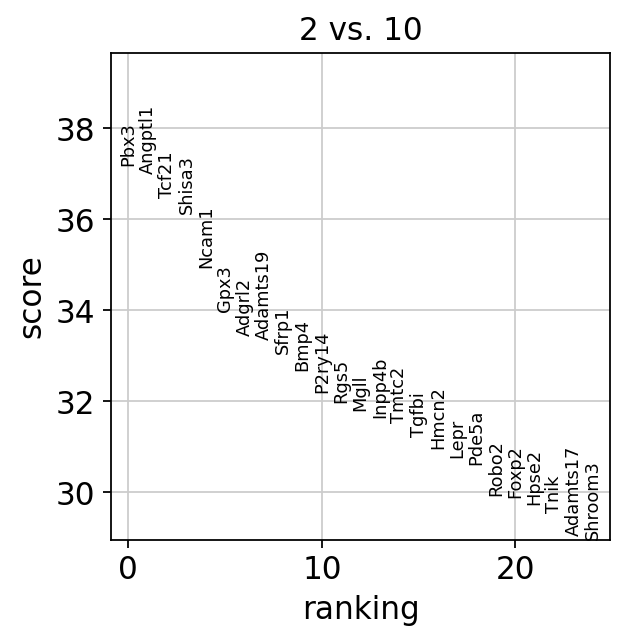

In [62]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon', use_raw = False, groups = ['2'], reference = '10')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [23]:
adata.obs['stage_grouped'] = np.where(adata.obs['stage'].isin(['uninfected_adult_1', 'uninfected_adult_2']), 
                                     'uninfected_adult', 
                                     adata.obs['stage'])

# Convert 'stage_grouped' to a categorical type
adata.obs['stage_grouped'] = pd.Categorical(adata.obs['stage_grouped'])

In [24]:
sc.tl.score_genes_cell_cycle(adata, s_genes=S_genes_list, g2m_genes=G2M_genes_list, use_raw=False) #gene_pool=unique_genes_list

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    409 total control genes are used. (0:00:02)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    409 total control genes are used. (0:00:02)
-->     'phase', cell cycle phase (adata.obs)


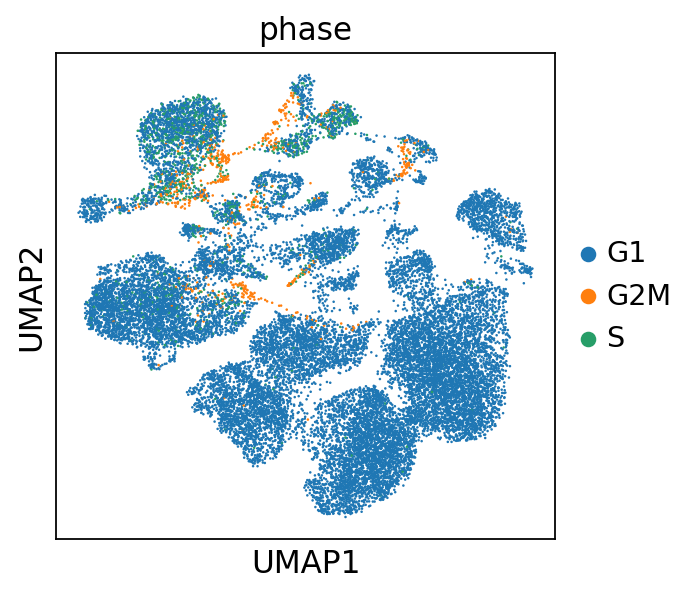

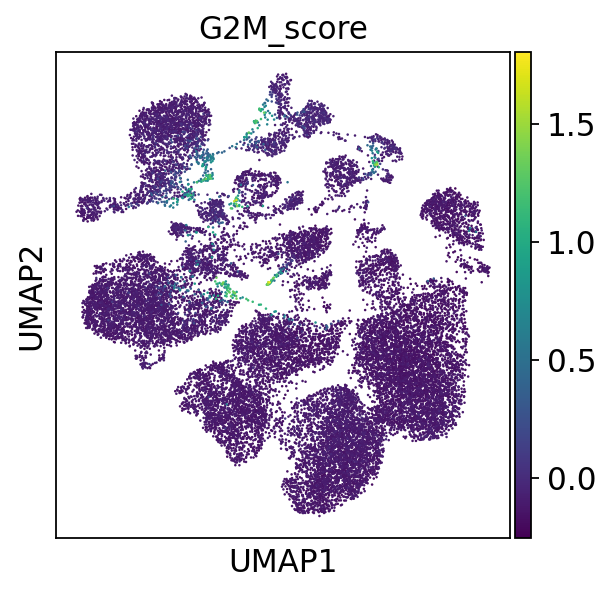

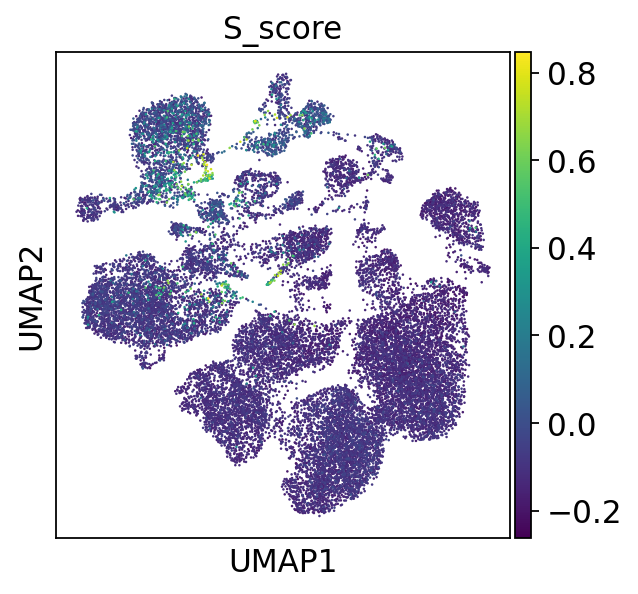

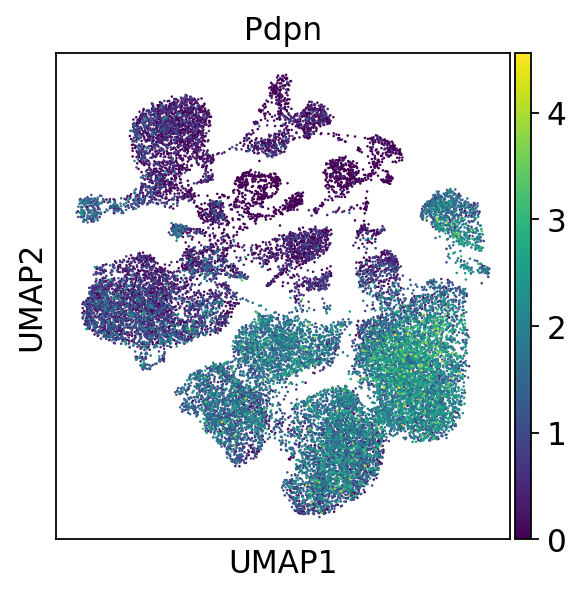

In [25]:
sc.pl.umap(adata, color = "phase", use_raw=False)
sc.pl.umap(adata, color = "G2M_score", use_raw=False)
sc.pl.umap(adata, color = "S_score", use_raw=False)
sc.pl.umap(adata, color = "Pdpn", use_raw=False)

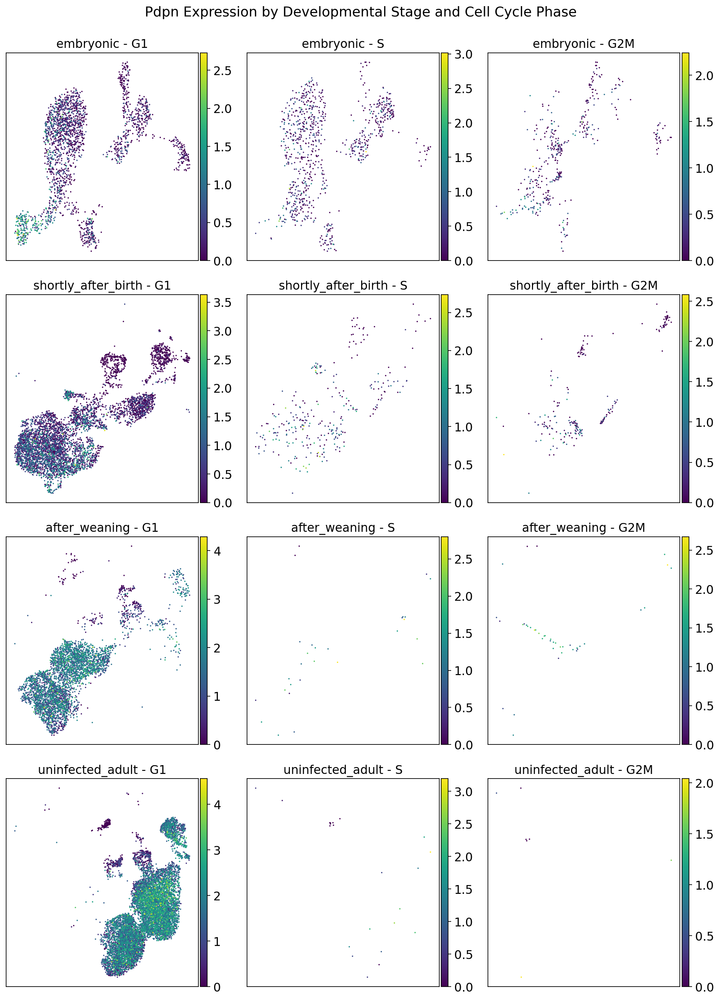

In [26]:
# Define the specific order for categories for "stage_grouped"
stage_grouped_order = ['embryonic', 'shortly_after_birth', 'after_weaning', 'uninfected_adult']

# Define the specific order for categories for "phase"
phases_order = ['G1', 'S', 'G2M']

# Determine the number of categories
n_stages = len(stage_grouped_order)
n_phases = len(phases_order)

# Create a figure with subplots - each subplot corresponds to a combination of "stage_grouped" and "phase"
fig, axs = plt.subplots(n_stages, n_phases, figsize=(4*n_phases, 4*n_stages))  # Adjust figsize as needed

for i, stage in enumerate(stage_grouped_order):
    for j, phase in enumerate(phases_order):
        # Subset data for the current combination of stage and phase
        adata_subset = adata[(adata.obs['stage_grouped'] == stage) & (adata.obs['phase'] == phase)].copy()
        
        # Check if there are any samples in the subset
        if not adata_subset.obs.empty:
            # Plot UMAP for the subset on the current subplot
            sc.pl.umap(adata_subset, title=f'{stage} - {phase}', ax=axs[i, j], show=False, use_raw=False, color="Pdpn", size=10)
            axs[i, j].set_xlabel('')
            axs[i, j].set_ylabel('')
        else:
            axs[i, j].axis('off')  # Hide axis if no samples in the subset

# Adjust the layout and add a general title
plt.tight_layout()
fig.suptitle('Pdpn Expression by Developmental Stage and Cell Cycle Phase', fontsize=16, y=1.02)  # Adjust fontsize as needed

# Show the plot
plt.show()

In [32]:
velocity_embryonic = scv.read("/vol/MainVol/Project_663_scRNA_Seq_MSZP85_87/23L002447/velocyto/23L002447.loom", cache=True, validate = False)
velocity_newborn = scv.read("/vol/MainVol/Project_663_scRNA_Seq_MSZP85_87/23L002448/velocyto/23L002448.loom", cache=True, validate = False)
velocity_afterweaning = scv.read("/vol/MainVol/Project_663_scRNA_Seq_MSZP85_87/23L002449/velocyto/23L002449.loom", cache=True, validate = False)
velocity_adult = scv.read("/vol/MainVol/Project_663_scRNA_Seq_MSZP85_87/23L002450/velocyto/23L002450.loom", cache=True, validate = False)
velocity_uninfected = scv.read("/vol/MainVol/Project_663_scRNA_Seq_MSZP85_87/23L002443/velocyto/23L002443.loom", cache=True, validate = False)

... reading from cache file cache/vol-MainVol-Project_663_scRNA_Seq_MSZP85_87-23L002447-velocyto-23L002447.h5ad
... reading from cache file cache/vol-MainVol-Project_663_scRNA_Seq_MSZP85_87-23L002448-velocyto-23L002448.h5ad
... reading from cache file cache/vol-MainVol-Project_663_scRNA_Seq_MSZP85_87-23L002449-velocyto-23L002449.h5ad
... reading from cache file cache/vol-MainVol-Project_663_scRNA_Seq_MSZP85_87-23L002450-velocyto-23L002450.h5ad
... reading from cache file cache/vol-MainVol-Project_663_scRNA_Seq_MSZP85_87-23L002443-velocyto-23L002443.h5ad


In [33]:
velocity_development = ad.concat([velocity_embryonic,velocity_newborn,velocity_afterweaning,velocity_adult,velocity_uninfected], merge="same")
velocity_development

AnnData object with n_obs × n_vars = 35842 × 40879
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [34]:
adata.obs

,Unnamed: 0,orig.ident,nCount_RNA,nFeature_RNA,Sample_ID,stage,percent.mt,CellName,doublet_finder,Doublet_classification,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,dpt_pseudotime
0,AAACCCAAGTATCTGC-1_1,23L002443,23112,5661,S1,uninfected_adult_1,1.691762,AAACCCAAGTATCTGC-1_1,2,Singlet,5661,23112.0,391.0,1.691762,0,0.701779
1,AAACCCACATGACTGT-1_1,23L002443,24744,5161,S1,uninfected_adult_1,0.832525,AAACCCACATGACTGT-1_1,4,Singlet,5161,24744.0,206.0,0.832525,1,0.745440
3,AAAGGATTCCAAACCA-1_1,23L002443,13515,3817,S1,uninfected_adult_1,0.606733,AAAGGATTCCAAACCA-1_1,1,Singlet,3817,13515.0,82.0,0.606733,1,0.699140
4,AAAGGGCAGTCTACCA-1_1,23L002443,16803,4118,S1,uninfected_adult_1,1.487830,AAAGGGCAGTCTACCA-1_1,12,Singlet,4118,16803.0,250.0,1.487830,0,0.690316
6,AAAGGTACACCACATA-1_1,23L002443,28031,5205,S1,uninfected_adult_1,1.091649,AAAGGTACACCACATA-1_1,9,Singlet,5205,28031.0,306.0,1.091649,1,0.699845
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62869,TTTGTTGGTAGTGATA-1_8,23L002450,16606,3751,S8,uninfected_adult_2,1.192340,TTTGTTGGTAGTGATA-1_8,4,Singlet,3751,16606.0,198.0,1.192340,0,0.706966
62870,TTTGTTGTCACATCAG-1_8,23L002450,19328,4592,S8,uninfected_adult_2,1.728063,TTTGTTGTCACATCAG-1_8,1,Singlet,4592,19328.0,334.0,1.728063,0,0.717209
62871,TTTGTTGTCAGGACGA-1_8,23L002450,22759,5305,S8,uninfected_adult_2,1.274221,TTTGTTGTCAGGACGA-1_8,1,Singlet,5305,22759.0,290.0,1.274221,0,0.695804
62872,TTTGTTGTCCCATAAG-1_8,23L002450,20598,4859,S8,uninfected_adult_2,1.004952,TTTGTTGTCCCATAAG-1_8,1,Singlet,4859,20598.0,207.0,1.004952,0,0.701160


In [35]:
velocity_development.obs

""
CellID
23L002447:AAACGCTCAGTTCTAGx
23L002447:AAAGTCCCAAATGAGTx
23L002447:AAAGAACTCATGAGAAx
23L002447:AAAGGGCGTATGGGACx
23L002447:AAAGTGAAGCTCGTGCx
...
23L002443:TTTGGTTCATCTCGTCx
23L002443:TTTGGTTAGTGGAATTx
23L002443:TTTGGTTTCTCTCAATx


In [36]:
# Convert 'CellName' and 'orig.ident' to string
adata.obs['CellName_str'] = adata.obs['CellName'].astype(str)
adata.obs['orig_ident_str'] = adata.obs['orig.ident'].astype(str)

# Replace the dash, numbers, and underscores at the end of CellName with "x"
adata.obs['ModifiedCellName'] = adata.obs['CellName_str'].str.replace(r'-.*$', 'x', regex=True)

# Create 'CellID' by joining modified 'CellName' and 'orig.ident' with a colon, ensure all parts are strings
adata.obs['CellID'] = adata.obs['orig_ident_str'] + ':' + adata.obs['ModifiedCellName']

# Optionally, convert 'CellID' back to categorical if needed
adata.obs['CellID'] = adata.obs['CellID'].astype('category')

# Display the result
print(adata.obs[['CellName', 'orig.ident', 'ModifiedCellName', 'CellID']].head())

               CellName orig.ident   ModifiedCellName  \
0  AAACCCAAGTATCTGC-1_1  23L002443  AAACCCAAGTATCTGCx   
1  AAACCCACATGACTGT-1_1  23L002443  AAACCCACATGACTGTx   
3  AAAGGATTCCAAACCA-1_1  23L002443  AAAGGATTCCAAACCAx   
4  AAAGGGCAGTCTACCA-1_1  23L002443  AAAGGGCAGTCTACCAx   
6  AAAGGTACACCACATA-1_1  23L002443  AAAGGTACACCACATAx   

                        CellID  
0  23L002443:AAACCCAAGTATCTGCx  
1  23L002443:AAACCCACATGACTGTx  
3  23L002443:AAAGGATTCCAAACCAx  
4  23L002443:AAAGGGCAGTCTACCAx  
6  23L002443:AAAGGTACACCACATAx  


In [37]:
adata.obs.set_index('CellID', inplace=True)

In [38]:
merged_obs = pd.merge(velocity_development.obs, adata.obs, left_index=True, right_index=True, how='inner')

In [39]:
# Ensure cells are in the same order for both objects
velocity_development = velocity_development[merged_obs.index]
adata = adata[merged_obs.index]

In [106]:
adata = scv.utils.merge(adata, velocity_development)

In [108]:
scv.pp.filter_and_normalize(adata)

/home/ubuntu/anaconda3/envs/scanpy/lib/python3.11/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


Logarithmized X.


In [118]:
scv.pp.moments(adata, n_pcs=50, n_neighbors=30)

#And then...
scv.tl.recover_dynamics(adata, n_jobs=20) #separately... (!!) takes around 4 m: 15:15-18

computing neighbors
    finished (0:00:10) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:52) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 20/28 cores)


  0%|          | 0/1894 [00:00<?, ?gene/s]

    finished (0:05:49) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [119]:
scv.tl.velocity(adata, mode="dynamical", use_latent_time = True) #separately as a oneliner, not in the 'cell'...
scv.tl.velocity_graph(adata) #separately... and the note in the next line the basis as 'umap' and not 'X_umap'

computing velocities
    finished (0:00:35) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/28 cores)


  0%|          | 0/23004 [00:00<?, ?cells/s]

    finished (0:02:10) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [122]:
adata

AnnData object with n_obs × n_vars = 23004 × 13763
    obs: 'Unnamed: 0', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Sample_ID', 'stage', 'percent.mt', 'CellName', 'doublet_finder', 'Doublet_classification', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'dpt_pseudotime', 'CellName_str', 'orig_ident_str', 'ModifiedCellName', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes', 'velocity

computing velocity embedding
    finished (0:00:06) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


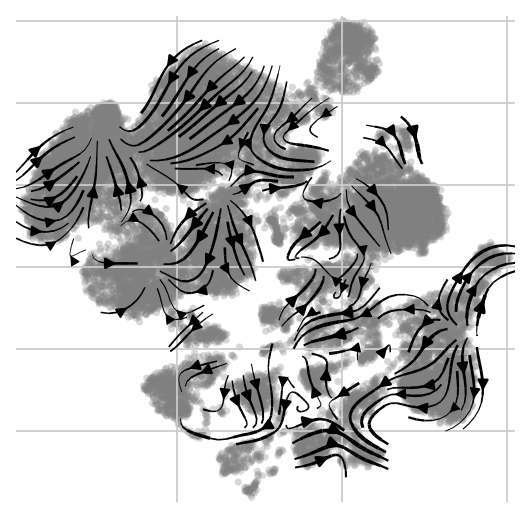

In [120]:
scv.pl.velocity_embedding_stream(adata, basis="umap", legend_fontsize=12, title="", 
                                 smooth=0.8, min_mass=4)

In [112]:
scv.tl.latent_time(adata, root_key = "iroot")

computing terminal states
    identified 9 regions of root cells and 6 regions of end points .
    finished (0:00:06) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root cell 1349 as prior
    finished (0:00:07) --> added 
    'latent_time', shared time (adata.obs)


/home/ubuntu/anaconda3/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


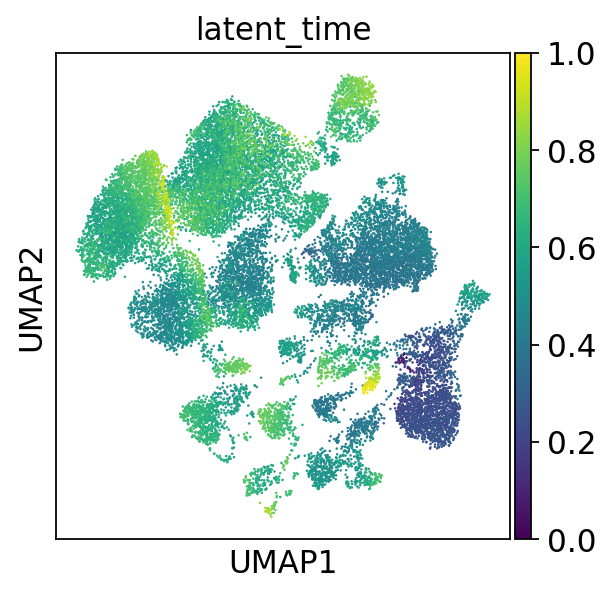

In [113]:
sc.pl.umap(adata, color = "latent_time", use_raw=False)

In [63]:
scv.tl.velocity_pseudotime(adata, root_key = "iroot")

/home/ubuntu/anaconda3/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


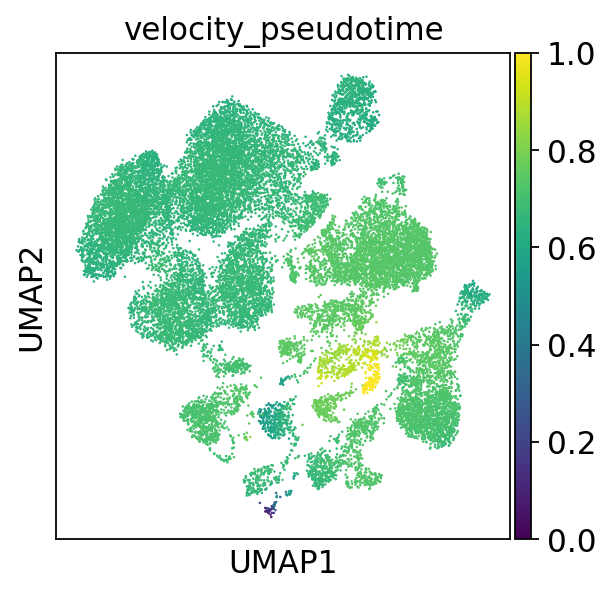

In [64]:
sc.pl.umap(adata, color = "velocity_pseudotime", use_raw=False)

In [29]:
adata.uns['iroot'] = np.flatnonzero((adata.obs['stage'] == 'embryonic'))[0]

In [67]:
sc.tl.dpt(adata)

computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


/home/ubuntu/anaconda3/envs/scanpy/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


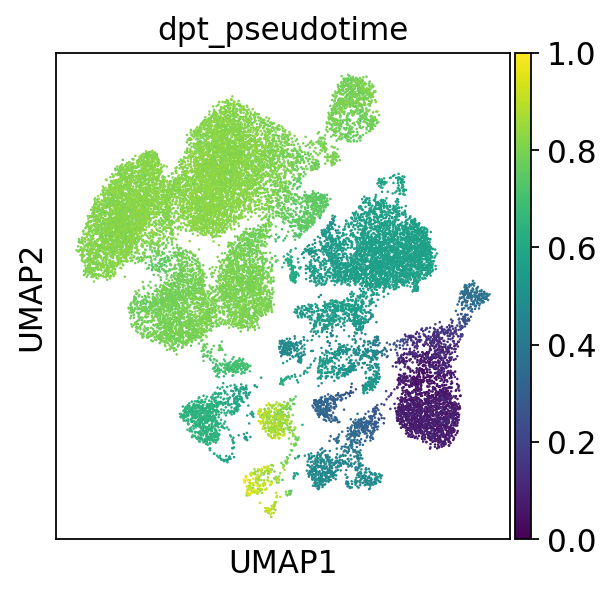

In [68]:
sc.pl.umap(adata, color=['dpt_pseudotime'], legend_loc='on data')

In [65]:
sc.tl.paga(adata, use_rna_velocity=True)

running PAGA
    finished: added
    'paga/transitions_confidence', connectivities adjacency (adata.uns) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


<Axes: >

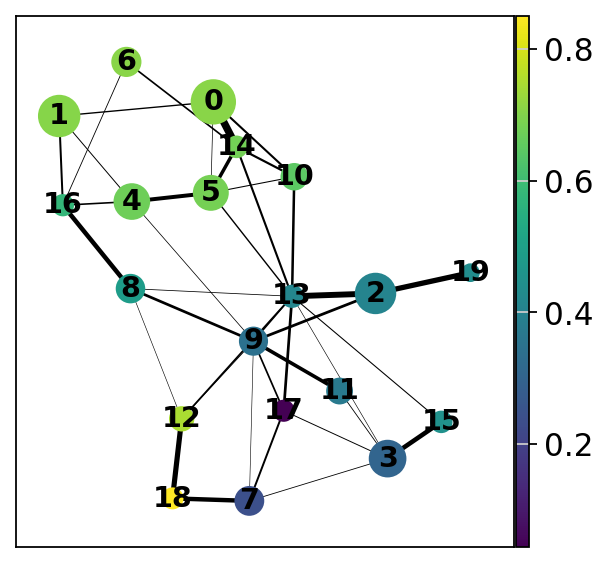

In [66]:
sc.pl.paga(adata, threshold=0.03, show=False, color = ['dpt_pseudotime'])

In [73]:
scv.tl.rank_velocity_genes(adata, groupby="leiden")

ranking velocity genes


/home/ubuntu/anaconda3/envs/scanpy/lib/python3.11/site-packages/scvelo/tools/utils.py:463: DeprecationWarning: Please use `rankdata` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import rankdata


    finished (0:00:59) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


ValueError: no field of name Beta

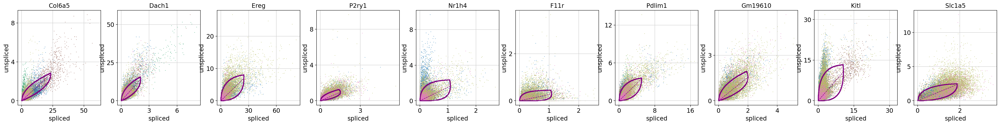

In [104]:
scv.pl.scatter(adata, basis=adata.uns["rank_velocity_genes"]["names"]["5"][:10], color="stage")